# Predicting Credit Card Customer Churn

#### Authors: Ethan Moody and Eugene Oon

#### Date: April 2023

------------------------------------------------------------------------------------------------------------------

# Background and Problem Description

**Context:**
A bank manager is concerned with the number of customers leaving their credit card services. They would like someone to build a model to predict which customers are likely to churn/attrit so they can proactively offer them better services. The ideal case would be that, as a result of these services, the bank retains these customers and can continue to generate revenue from card fees or increase capital/lending position from higher bank balances.

**Problem Description:**
Build an ML model to predict which customers are likely to leave the bank's credit card services.

**Analyzed Dataset:**
From Kaggle: https://www.kaggle.com/datasets/sakshigoyal7/credit-card-customers.

**Original Data Source:**
The information within this dataset was originally sourced from https://leaps.analyttica.com/home.

**Data Description:**
This dataset consists of ~10,000 customer records and corresponding demographic/financial information (e.g., customer age, salary, marital status, credit card limit, credit card category, etc.). There are around 20 total features. Only ~16% of the records correspond to attrited customers.

**Data Dictionary:**

_Core Columns:_

1. **`CLIENTNUM`**: Unique identifier for the account holder/customer
2. **`Attrition_Flag`**: Internal event (customer activity) variable - if the account is closed then "Attrited Customer", else "Existing Customer"
3. **`Customer_Age`**: Age of the account holder (in years)
4. **`Gender`**: Gender of the account holder
5. **`Dependent_count`**: Number of dependents associated with the account holder
6. **`Education_Level`**: Educational qualification of the account holder
7. **`Marital_Status`**: Marital status of the account holder
8. **`Income_Category`**: Annual income of the account holder
9. **`Card_Category`**: Type of card owned by the account holder
10. **`Months_on_book`**: Length of relationship that the account holder has had with the bank
11. **`Total_Relationship_Count`**: Total number of products held by the account holder
12. **`Months_Inactive_12_mon`**: Number of months the account has been inactive in the last 12 months
13. **`Contacts_Count_12_mon`**: Number of contacts between the account holder and bank in the last 12 months
14. **`Credit_Limit`**: Credit limit on the account holder's credit card
15. **`Total_Revolving_Bal`**: The balance that carries over from one month to the next
16. **`Avg_Open_To_Buy`**: The amount left on the credit card to use (average of last 12 months)
17. **`Total_Trans_Amt`**: Total transaction amount (total over last 12 months)
18. **`Total_Trans_Ct`**: Total transaction count (total over last 12 months)
19. **`Total_Ct_Chng_Q4_Q1`**: Ratio of the total transaction count in 4th quarter and the total transaction count in 1st quarter
20. **`Total_Amt_Chng_Q4_Q1`**: Ratio of the total transaction amount in 4th quarter and the total transaction amount in 1st quarter
21. **`Avg_Utilization_Ratio`**: Represents how much of the available credit the account holder has spent

_Unnecessary Columns from Uploader:_

22. **`Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1`**: Holdover column from uploader testing - remove after dataset load
23. **`Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2`**: Holdover column from uploader testing - remove after dataset load

(Sourced from: https://www.kaggle.com/code/riteshvsharma/thera-bank-credit-card-churners/notebook.)

# Project Approach

The analysis is organized into five parts:

1. Load, clean, and profile credit card customer data, then split data into training/validation/testing sets.

2. Explore and analyze training set and perform feature engineering.

3. Develop, train, and evaluate a suite of classification models that predict customer attrition, using validation set for model tuning.

4. Select best performing model and run on testing set to see if model generalizes well to new, unseen data.

5. Summarize conclusions, implications, and next steps to share with the business.


------------------------------------------------------------------------------------------------------------------

## ====================================================================
## Part 1: Understanding the Data
**Objective:** Load, clean, and profile credit card customer data, then split data into training/validation/testing sets.
## ====================================================================

### `[1.A] Import Libraries/Packages and Configure Visualization Settings`

In [1]:
# Import standard libraries
import pandas as pd
import numpy as np
import random
from subprocess import call
from IPython.display import Image

# Import ML/DL libraries
import tensorflow as tf
from tensorflow import keras
from keras import metrics
from tensorflow.keras.metrics import Precision, Recall 
tf.get_logger().setLevel("INFO")
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve, GridSearchCV
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.tree import export_graphviz
from sklearn.utils import class_weight
# !pip install shap
import shap
import xgboost as xgb
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler

# Import visualization/plotting libraries
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline
# !pip install scikit-plot
import scikitplot as skplt
import plotly.graph_objs as go
import plotly.express as px

In [2]:
# Specify path to raw dataset - update as needed
from google.colab import drive
drive.mount("/content/drive")
raw_data_path = "/content/drive/My Drive/Colab Notebooks/BankChurners.csv"

### `[1.B] Load Raw Data`

In [3]:
# Load raw dataset
df_pp = pd.read_csv(raw_data_path)

In [4]:
# Remove last two columns from raw dataset based on documentation (unnecessary columns)
df_pp.drop(
    ["Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1",
     "Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2"],
    axis = "columns",
    inplace = True
)

# Display dataset dimensions - i.e., (number of rows, number of columns)
print("Shape of dataset:", df_pp.shape)

Shape of dataset: (10127, 21)


##### Observations:
- The data appears to have loaded successfully.
- There are just over 10,000 rows (observations) in this dataset.
- There are 21 columns in this dataset after removing the final two unnecessary columns. This is consistent with the data dictionary documentation above.

### `[1.C] Profile Data`

In [5]:
# Identify all columns in dataset
display(df_pp.columns)

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [6]:
# Identify datatypes and missing/null values in dataset
display(df_pp.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

None

In [7]:
# Identify duplicate rows in dataset
duplicates = sum(df_pp.duplicated())
print("Number of duplicated rows in dataset:", duplicates)

Number of duplicated rows in dataset: 0


In [8]:
# Iterate through each object column and identify unique column values
for col in df_pp.columns:
    if df_pp[col].dtype == "object":
        print(f"{col}: {df_pp[col].unique()}\n")

Attrition_Flag: ['Existing Customer' 'Attrited Customer']

Gender: ['M' 'F']

Education_Level: ['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']

Marital_Status: ['Married' 'Single' 'Unknown' 'Divorced']

Income_Category: ['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']

Card_Category: ['Blue' 'Gold' 'Silver' 'Platinum']



##### Observations:
- There appear to be no null values or duplicates in the dataset; the data looks complete and clean from an initial glance.
- Several columns are instantiated as "object" datatypes:
    - Class/target column: **`Attrition_Flag`**
    - Certain feature columns: **`Gender`**, **`Education_Level`**, **`Marital_Status`**, **`Income_Category`**, and **`Card_Category`**
- These object columns may need to be reencoded as integers or floats or transformed into categories (with binning) to be compatible with certain modeling approaches.

### `[1.D] Shuffle and Split Data into Training/Validation/Testing Sets`

In [9]:
# Shuffle records in dataset to eliminate any bias from original data sequence
df_pp_shuffled = df_pp.sample(frac = 1, random_state = 42).reset_index(drop = True)

# Create new label for shuffled dataset (note: target variable is retained for easier EDA later on)
X = df_pp_shuffled

# Create new label for the target variable values (excluding all feature columns)
y = df_pp_shuffled["Attrition_Flag"]

# Split shuffled data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

# Split shuffled training data into training and validation (dev) sets
X_train, X_dev, y_train, y_dev = train_test_split(X_train, y_train, test_size = 0.125, random_state = 42)

In [10]:
# Check shape of training, validation (dev), and testing sets
print("Shape of Training set:", X_train.shape, y_train.shape)
print("Shape of Validation set:", X_dev.shape, y_dev.shape)
print("Shape of Testing set:", X_test.shape, y_test.shape)

Shape of Training set: (7088, 21) (7088,)
Shape of Validation set: (1013, 21) (1013,)
Shape of Testing set: (2026, 21) (2026,)


##### Observations:
- The original dataset dimensions were (10127, 21).
- We intend to allocate 70% of the data to training, 10% to validation, and 20% to testing.
- Based on their dimensions (specifically, the row counts), the new dataset proportions are:
    - **Training:** ~70% (7088 / 10127)
    - **Validation:** ~10% (1013 / 10127)
    - **Testing:** ~20% (2026 / 10127)
- These proportions match our intent and preserve all rows/records. This shows that the splitting above executed successfully.

### `[1.E] Part 1 Summary`
- We set the context, defined a problem statement, and outlined our objectives for the modeling task.
- We loaded the raw data and completed initial data profiling steps.
- We checked the data for missing values and duplicates and found none.
- We shuffled the data to remove any bias from its original order.
- We split the data into training, validation, and testing subsets to prepare for modeling.
- We are now ready to move forward with EDA (**`Part 2`**), which we will perform on the training set only.
- Note: We may complete additional "data preprocessing" later on, subject to the needs of each modeling approach tested.

------------------------------------------------------------------------------------------------------------------

## ====================================================================
## Part 2: Exploratory Data Analysis (EDA)
**Objective:** Explore and analyze training set and perform feature engineering.
## ====================================================================

### `[2.A] Examine Training Set and Summary Statistics`

In [11]:
# Set dataframe column display settings to show all columns
pd.set_option("display.max_columns", None)

In [12]:
# Display top rows of training set
display(X_train.head())

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
9617,714931458,Existing Customer,52,F,2,Post-Graduate,Single,Unknown,Blue,42,3,2,3,1438.3,0,1438.3,0.607,4102,78,0.857,0.000
370,758202858,Existing Customer,47,F,3,High School,Unknown,Less than $40K,Blue,40,4,2,4,4255.0,1681,2574.0,0.650,3453,72,0.500,0.395
9170,715435758,Existing Customer,42,M,2,Graduate,Single,$80K - $120K,Blue,36,3,1,3,3046.0,1231,1815.0,0.692,4711,77,0.878,0.404
5702,803355408,Existing Customer,50,M,2,Unknown,Married,$60K - $80K,Blue,44,5,3,1,2205.0,1659,546.0,0.891,4813,77,0.674,0.752
7224,771349458,Existing Customer,33,M,2,Graduate,Married,$40K - $60K,Blue,20,4,3,3,5657.0,1792,3865.0,0.904,1914,46,0.769,0.317


In [13]:
# Display bottom rows of training set
display(X_train.tail())

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
9699,715277583,Existing Customer,55,F,3,Uneducated,Divorced,Less than $40K,Blue,36,3,2,1,2111.0,1209,902.0,0.594,2803,61,0.605,0.573
1821,709585758,Existing Customer,41,M,4,High School,Single,$120K +,Blue,28,5,1,4,34516.0,0,34516.0,0.791,4004,86,0.755,0.000
8252,709375158,Existing Customer,29,F,1,Unknown,Unknown,Unknown,Blue,36,6,3,2,7270.0,1835,5435.0,0.860,3759,69,0.917,0.252
4968,783625008,Existing Customer,51,M,2,Post-Graduate,Single,$120K +,Blue,45,4,2,2,22294.0,0,22294.0,0.647,3444,71,0.614,0.000
2590,711147483,Attrited Customer,46,F,3,Graduate,Single,Less than $40K,Blue,28,2,2,3,8551.0,1067,7484.0,0.931,1097,32,0.778,0.125


In [14]:
# Examine summary statistics for all numeric columns in training set
display(X_train.select_dtypes(include = ["int", "float"]).describe())

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,7.088000e+03,7088.000000,7088.000000,7088.000000,7088.000000,7088.000000,7088.000000,7088.000000,7088.000000,7088.000000,7088.000000,7088.000000,7088.000000,7088.000000,7088.000000
mean,7.393386e+08,46.410271,2.345372,36.013403,3.813488,2.352850,2.446953,8704.966422,1168.690886,7536.275536,0.758683,4401.461343,64.885581,0.712757,0.276176
std,3.707239e+07,8.019422,1.302684,7.984284,1.556401,1.020084,1.112169,9167.964998,815.172874,9170.250789,0.217843,3404.029183,23.721689,0.240811,0.276830
min,7.080821e+08,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,530.000000,10.000000,0.000000,0.000000
25%,7.131048e+08,41.000000,1.000000,32.000000,3.000000,2.000000,2.000000,2563.000000,429.500000,1315.750000,0.631000,2143.000000,45.000000,0.581000,0.023000
50%,7.179056e+08,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4593.500000,1291.000000,3512.000000,0.735000,3895.000000,67.000000,0.703000,0.177000
75%,7.781328e+08,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11087.250000,1785.000000,9892.000000,0.857000,4745.250000,81.000000,0.818000,0.506000
max,8.282989e+08,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.571000,0.999000


In [15]:
# Examine summary statistics for all categorical (object) columns in training set
display(X_train.select_dtypes(include = ["object"]).describe())

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
count,7088,7088,7088,7088,7088,7088
unique,2,2,7,4,6,4
top,Existing Customer,F,Graduate,Married,Less than $40K,Blue
freq,5971,3739,2209,3308,2480,6611


##### Observations:
- Based on head/tail samples, there appear to be a variety of numeric and categorical variables in the dataset (as indicated by earlier profiling steps).
- The formatting of the data looks consistent throughout the head/tail samples.
- We can safely drop the **`CLIENTNUM`** field (unique ID). It will not be used in EDA or modeling.
- We do not yet know at this point which of the variables are worth preserving for modeling or dropping.

### `[2.B] Basic Feature Engineering (Reencoding)`

In [16]:
# Drop CLIENTNUM unique ID column from training, validation (dev), and testing sets
X_train.drop(["CLIENTNUM"], axis = 1, inplace = True)
X_dev.drop(["CLIENTNUM"], axis = 1, inplace = True)
X_test.drop(["CLIENTNUM"], axis = 1, inplace = True)

In [17]:
# Map object column values to numeric values for reencoding
mappings = {
    
    "Attrition_Flag": {"Existing Customer": 0, "Attrited Customer": 1},
    
    "Gender": {"M": 1, "F": 2},
    
    "Education_Level": {"Unknown": 0, "Uneducated": 1, "High School": 2, "College": 3,
                        "Graduate": 4, "Post-Graduate": 5, "Doctorate": 6},
    
    "Marital_Status": {"Unknown": 0, "Single": 1, "Married": 2, "Divorced": 3},
    
    "Income_Category": {"Unknown": 0, "Less than $40K": 1, "$40K - $60K": 2,
                        "$60K - $80K": 3, "$80K - $120K": 4, "$120K +": 5},
    
    "Card_Category": {"Blue": 1, "Silver": 2, "Gold": 3, "Platinum": 4}
    
}

# Create list of training, validation (dev), and testing sets
X_subsets = [X_train, X_dev, X_test]

# Iterate through training, validation (dev), and testing sets and map object column values to numeric values
for x in X_subsets:
    for col, mapping in mappings.items():
        x[f"{col}_RE"] = x[col].map(mapping)

# Display new reencoded values for object columns
for col in mappings:
    print(f"{col} Reencoded:")
    print(X_train[f"{col}_RE"].unique(), "\n")

# Map class/target column values (originall in string form) to numeric values
y_train = y_train.map(mappings["Attrition_Flag"])
y_dev = y_dev.map(mappings["Attrition_Flag"])
y_test = y_test.map(mappings["Attrition_Flag"])

Attrition_Flag Reencoded:
[0 1] 

Gender Reencoded:
[2 1] 

Education_Level Reencoded:
[5 2 4 0 1 6 3] 

Marital_Status Reencoded:
[1 0 2 3] 

Income_Category Reencoded:
[0 1 4 3 2 5] 

Card_Category Reencoded:
[1 2 3 4] 



In [18]:
## Feature Engineering: Use "binning" to help with data visualizations/distributions

# Create bins and labels for granular numeric columns, guided by summary statistics in preceding step
customer_age_bins = [0, 20, 30, 40, 50, 60, 70, 80]
customer_age_labels = ["20 or Below", "20 - 30", "30 - 40", "40 - 50", "50 - 60", "60 - 70", "Over 70"]

months_on_book_bins = [0, 12, 24, 36, 48, 60, 72]
months_on_book_labels = ["12 or Below", "12 - 24", "24 - 36", "36 - 48", "48 - 60", "Over 60"]

credit_limit_bins = [0, 5000, 10000, 15000, 20000, 25000, 30000, 35000]
credit_limit_labels = ["5000 or Below", "5000 - 10000", "10000 - 15000", "15000 - 20000",
                       "20000 - 25000", "25000 - 30000", "Over 30000"]

total_revolving_bal_bins = [0, 500, 1000, 1500, 2000, 2500, 3000, 3500]
total_revolving_bal_labels = ["500 or Below", "500 - 1000", "1000 - 1500", "1500 - 2000",
                              "2000 - 2500", "2500 - 3000", "Over 3000"]

avg_open_to_buy_bins = [0, 5000, 10000, 15000, 20000, 25000, 30000, 35000]
avg_open_to_buy_labels = ["5000 or Below", "5000 - 10000", "10000 - 15000", "15000 - 20000",
                          "20000 - 25000", "25000 - 30000", "Over 30000"]

total_amt_chng_Q4_Q1_bins = [0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0]
total_amt_chng_Q4_Q1_labels = ["0.5 or Below", "0.5 - 1.0", "1.0 - 1.5", "1.5 - 2.0",
                               "2.0 - 2.5", "2.5 - 3.0", "3.0 - 3.5", "Over 3.5"]

total_trans_amt_bins = [0, 3000, 6000, 9000, 12000, 15000, 18000, 21000, 24000]
total_trans_amt_labels = ["3000 or Below", "3000 - 6000", "6000 - 9000", "9000 - 12000",
                          "12000 - 15000", "15000 - 18000", "18000 - 21000", "Over 21000"]

total_trans_ct_bins = [0, 20, 40, 60, 80, 100, 120, 140, 160]
total_trans_ct_labels = ["Under 20", "20-40", "40-60", "60-80",
                         "80-100", "100-120", "120-140", "Over 140"]

total_ct_chng_Q4_Q1_bins = [0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0]
total_ct_chng_Q4_Q1_labels = ["0.5 or Below", "0.5 - 1.0", "1.0 - 1.5", "1.5 - 2.0",
                              "2.0 - 2.5", "2.5 - 3.0", "3.0 - 3.5", "Over 3.5"]

avg_utilization_ratio_bins = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
avg_utilization_ratio_labels = ["Under 10%", "10-20%", "20-30%", "30-40%", "40-50%",
                                "50-60%", "60-70%", "70-80%", "80-90%", "Over 90%"]

# Specify ordering of labels for object columns for visualizations
attrition_flag_RE_order = [0, 1]

gender_order = ["M", "F"]

education_level_order = ["Unknown", "Uneducated", "High School",
                         "College", "Graduate", "Post-Graduate", "Doctorate"]

marital_status_order = ["Unknown", "Single", "Married", "Divorced"]

income_category_order = ["Unknown", "Less than $40K", "$40K - $60K",
                         "$60K - $80K", "$80K - $120K", "$120K +"]

card_category_order = ["Blue", "Silver", "Gold", "Platinum"]

In [19]:
## Feature Engineering: Use "binning" to help with data visualizations/distributions

# Create a function to set defined bins to engineer new features
def bin_feature(df, col_name, bins, labels):
    """Creates a new categorical feature from numerical column with defined bins and labels.

    Arguments:
    ----------
    df: Dataframe which contains column to be engineered
    col_name: Name of numerical column to be engineered
    bins: List of bin edges
    labels: Label for each bin

    Returns:
    --------
    bf: Binned feature with new categorical labels
    """
    # Creates binned feature (note that lowest bound of the bin is included)
    bf = pd.cut(
        df[col_name],
        bins = bins,
        labels = labels,
        include_lowest = True
    )
    
    return bf

In [20]:
## Feature Engineering: Use "binning" to help with data visualizations/distributions

# Create list of columns with bins and labels
col_for_bin = [
    ["Customer_Age", customer_age_bins, customer_age_labels],
    ["Months_on_book", months_on_book_bins, months_on_book_labels],
    ["Credit_Limit", credit_limit_bins, credit_limit_labels],
    ["Total_Revolving_Bal", total_revolving_bal_bins, total_revolving_bal_labels],
    ["Avg_Open_To_Buy", avg_open_to_buy_bins, avg_open_to_buy_labels],
    ["Total_Amt_Chng_Q4_Q1", total_amt_chng_Q4_Q1_bins, total_amt_chng_Q4_Q1_labels],
    ["Total_Trans_Amt", total_trans_amt_bins, total_trans_amt_labels],
    ["Total_Trans_Ct", total_trans_ct_bins, total_trans_ct_labels],
    ["Total_Ct_Chng_Q4_Q1", total_ct_chng_Q4_Q1_bins, total_ct_chng_Q4_Q1_labels],
    ["Avg_Utilization_Ratio", avg_utilization_ratio_bins, avg_utilization_ratio_labels]
]

# Apply defined bins to create (engineer) new features for training, validation (dev), and testing sets
for x in X_subsets:
    for col in col_for_bin:
        x[f"{col[0]}_Binned"] = bin_feature(x, col[0], col[1], col[2])

In [21]:
# Check dimensions of training, validation (dev), and testing sets, with reencoded columns included (QC step)
print("Shape of Training set with reencoded columns:", X_train.shape)
print("Shape of Validation set with reencoded columns:", X_dev.shape)
print("Shape of Testing set with reencoded columns:", X_test.shape)

Shape of Training set with reencoded columns: (7088, 36)
Shape of Validation set with reencoded columns: (1013, 36)
Shape of Testing set with reencoded columns: (2026, 36)


In [22]:
# Identify all columns in training set, with reencoded columns included (QC step)
display(X_train.columns)

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Attrition_Flag_RE', 'Gender_RE', 'Education_Level_RE',
       'Marital_Status_RE', 'Income_Category_RE', 'Card_Category_RE',
       'Customer_Age_Binned', 'Months_on_book_Binned', 'Credit_Limit_Binned',
       'Total_Revolving_Bal_Binned', 'Avg_Open_To_Buy_Binned',
       'Total_Amt_Chng_Q4_Q1_Binned', 'Total_Trans_Amt_Binned',
       'Total_Trans_Ct_Binned', 'Total_Ct_Chng_Q4_Q1_Binned',
       'Avg_Utilization_Ratio_Binned'],
      dtype='object')

In [23]:
# Identify datatypes in training set, with reencoded columns included (QC step)
display(X_train.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7088 entries, 9617 to 2590
Data columns (total 36 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   Attrition_Flag                7088 non-null   object  
 1   Customer_Age                  7088 non-null   int64   
 2   Gender                        7088 non-null   object  
 3   Dependent_count               7088 non-null   int64   
 4   Education_Level               7088 non-null   object  
 5   Marital_Status                7088 non-null   object  
 6   Income_Category               7088 non-null   object  
 7   Card_Category                 7088 non-null   object  
 8   Months_on_book                7088 non-null   int64   
 9   Total_Relationship_Count      7088 non-null   int64   
 10  Months_Inactive_12_mon        7088 non-null   int64   
 11  Contacts_Count_12_mon         7088 non-null   int64   
 12  Credit_Limit                  7088 non-null  

None

In [24]:
# Display top rows of training set, with reencoded columns included (QC step)
display(X_train.head())

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag_RE,Gender_RE,Education_Level_RE,Marital_Status_RE,Income_Category_RE,Card_Category_RE,Customer_Age_Binned,Months_on_book_Binned,Credit_Limit_Binned,Total_Revolving_Bal_Binned,Avg_Open_To_Buy_Binned,Total_Amt_Chng_Q4_Q1_Binned,Total_Trans_Amt_Binned,Total_Trans_Ct_Binned,Total_Ct_Chng_Q4_Q1_Binned,Avg_Utilization_Ratio_Binned
9617,Existing Customer,52,F,2,Post-Graduate,Single,Unknown,Blue,42,3,2,3,1438.3,0,1438.3,0.607,4102,78,0.857,0.000,0,2,5,1,0,1,50 - 60,36 - 48,5000 or Below,500 or Below,5000 or Below,0.5 - 1.0,3000 - 6000,60-80,0.5 - 1.0,Under 10%
370,Existing Customer,47,F,3,High School,Unknown,Less than $40K,Blue,40,4,2,4,4255.0,1681,2574.0,0.650,3453,72,0.500,0.395,0,2,2,0,1,1,40 - 50,36 - 48,5000 or Below,1500 - 2000,5000 or Below,0.5 - 1.0,3000 - 6000,60-80,0.5 or Below,30-40%
9170,Existing Customer,42,M,2,Graduate,Single,$80K - $120K,Blue,36,3,1,3,3046.0,1231,1815.0,0.692,4711,77,0.878,0.404,0,1,4,1,4,1,40 - 50,24 - 36,5000 or Below,1000 - 1500,5000 or Below,0.5 - 1.0,3000 - 6000,60-80,0.5 - 1.0,40-50%
5702,Existing Customer,50,M,2,Unknown,Married,$60K - $80K,Blue,44,5,3,1,2205.0,1659,546.0,0.891,4813,77,0.674,0.752,0,1,0,2,3,1,40 - 50,36 - 48,5000 or Below,1500 - 2000,5000 or Below,0.5 - 1.0,3000 - 6000,60-80,0.5 - 1.0,70-80%
7224,Existing Customer,33,M,2,Graduate,Married,$40K - $60K,Blue,20,4,3,3,5657.0,1792,3865.0,0.904,1914,46,0.769,0.317,0,1,4,2,2,1,30 - 40,12 - 24,5000 - 10000,1500 - 2000,5000 or Below,0.5 - 1.0,3000 or Below,40-60,0.5 - 1.0,30-40%


In [25]:
# Display bottom rows of training set, with reencoded columns included (QC step)
display(X_train.tail())

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag_RE,Gender_RE,Education_Level_RE,Marital_Status_RE,Income_Category_RE,Card_Category_RE,Customer_Age_Binned,Months_on_book_Binned,Credit_Limit_Binned,Total_Revolving_Bal_Binned,Avg_Open_To_Buy_Binned,Total_Amt_Chng_Q4_Q1_Binned,Total_Trans_Amt_Binned,Total_Trans_Ct_Binned,Total_Ct_Chng_Q4_Q1_Binned,Avg_Utilization_Ratio_Binned
9699,Existing Customer,55,F,3,Uneducated,Divorced,Less than $40K,Blue,36,3,2,1,2111.0,1209,902.0,0.594,2803,61,0.605,0.573,0,2,1,3,1,1,50 - 60,24 - 36,5000 or Below,1000 - 1500,5000 or Below,0.5 - 1.0,3000 or Below,60-80,0.5 - 1.0,50-60%
1821,Existing Customer,41,M,4,High School,Single,$120K +,Blue,28,5,1,4,34516.0,0,34516.0,0.791,4004,86,0.755,0.000,0,1,2,1,5,1,40 - 50,24 - 36,Over 30000,500 or Below,Over 30000,0.5 - 1.0,3000 - 6000,80-100,0.5 - 1.0,Under 10%
8252,Existing Customer,29,F,1,Unknown,Unknown,Unknown,Blue,36,6,3,2,7270.0,1835,5435.0,0.860,3759,69,0.917,0.252,0,2,0,0,0,1,20 - 30,24 - 36,5000 - 10000,1500 - 2000,5000 - 10000,0.5 - 1.0,3000 - 6000,60-80,0.5 - 1.0,20-30%
4968,Existing Customer,51,M,2,Post-Graduate,Single,$120K +,Blue,45,4,2,2,22294.0,0,22294.0,0.647,3444,71,0.614,0.000,0,1,5,1,5,1,50 - 60,36 - 48,20000 - 25000,500 or Below,20000 - 25000,0.5 - 1.0,3000 - 6000,60-80,0.5 - 1.0,Under 10%
2590,Attrited Customer,46,F,3,Graduate,Single,Less than $40K,Blue,28,2,2,3,8551.0,1067,7484.0,0.931,1097,32,0.778,0.125,1,2,4,1,1,1,40 - 50,24 - 36,5000 - 10000,1000 - 1500,5000 - 10000,0.5 - 1.0,3000 or Below,20-40,0.5 - 1.0,10-20%


### `[2.C] Generate Key Plots and Visualizations on Training Set`

In [26]:
## Plotting: Create summary counts and grouped data for visualizations

# Create a function to compute summary counts for object feature variables
def obj_summary_counts(df, col_name, ordering):
    """Creates a summary of counts by value for a column within a dataframe and applies a set order
    to the output.

    Arguments:
    ----------
    df: Dataframe which contains column to be summarized
    col_name: Name of column to be summarized
    ordering: List specifying the intended order for the resulting summary counts

    Returns:
    --------
    col_vcounts: Summary counts for specified column
    """
    # Creates counts summary for a column and sorts based on a specified order
    col_vcounts = df[col_name].value_counts().reindex(ordering)
    
    return col_vcounts

In [27]:
## Plotting: Create summary counts and grouped data for visualizations

# Create a function to compute summary counts for categorical/ordinal and binned feature variables
def cat_binned_summary_counts(df, col_name):
    """Creates a summary of counts by value for a column within a dataframe and sorts the output.

    Arguments:
    ----------
    df: Dataframe which contains column to be summarized
    col_name: Name of column to be summarized

    Returns:
    --------
    col_vcounts: Summary counts for specified column
    """
    # Creates counts summary for a column and sorts from lowest to highest column value
    col_vcounts = df[col_name].value_counts().sort_index()
    
    return col_vcounts

In [28]:
## Plotting: Create summary counts and grouped data for visualizations

# Generate value counts for target variable
attrition_flag_RE_vcounts = np.unique(y_train, return_counts = True)

# Generate value counts for object feature variables
gender_vcounts = obj_summary_counts(X_train, "Gender", gender_order)
education_level_vcounts = obj_summary_counts(X_train, "Education_Level", education_level_order)
marital_status_vcounts = obj_summary_counts(X_train, "Marital_Status", marital_status_order)
income_category_vcounts = obj_summary_counts(X_train, "Income_Category", income_category_order)
card_category_vcounts = obj_summary_counts(X_train, "Card_Category", card_category_order)

# Generate value counts for categorical/ordinal and engineered (binned) feature variables
dependent_count_vcounts = cat_binned_summary_counts(X_train, "Dependent_count")
total_relationship_count_vcounts = cat_binned_summary_counts(X_train, "Total_Relationship_Count")
months_inactive_12mo_vcounts = cat_binned_summary_counts(X_train, "Months_Inactive_12_mon")
contacts_count_12mo_vcounts = cat_binned_summary_counts(X_train, "Contacts_Count_12_mon")
customer_age_binned_vcounts = cat_binned_summary_counts(X_train, "Customer_Age_Binned")
months_on_book_binned_vcounts = cat_binned_summary_counts(X_train, "Months_on_book_Binned")
credit_limit_binned_vcounts = cat_binned_summary_counts(X_train, "Credit_Limit_Binned")
total_revolving_bal_binned_vcounts = cat_binned_summary_counts(X_train, "Total_Revolving_Bal_Binned")
avg_open_to_buy_binned_vcounts = cat_binned_summary_counts(X_train, "Avg_Open_To_Buy_Binned")
total_amt_chng_Q4_Q1_binned_vcounts = cat_binned_summary_counts(X_train, "Total_Amt_Chng_Q4_Q1_Binned")
total_trans_amt_binned_vcounts = cat_binned_summary_counts(X_train, "Total_Trans_Amt_Binned")
total_trans_ct_binned_vcounts = cat_binned_summary_counts(X_train, "Total_Trans_Ct_Binned")
total_ct_chng_Q4_Q1_binned_vcounts = cat_binned_summary_counts(X_train, "Total_Ct_Chng_Q4_Q1_Binned")
avg_utilization_ratio_binned_vcounts = cat_binned_summary_counts(X_train, "Avg_Utilization_Ratio_Binned")

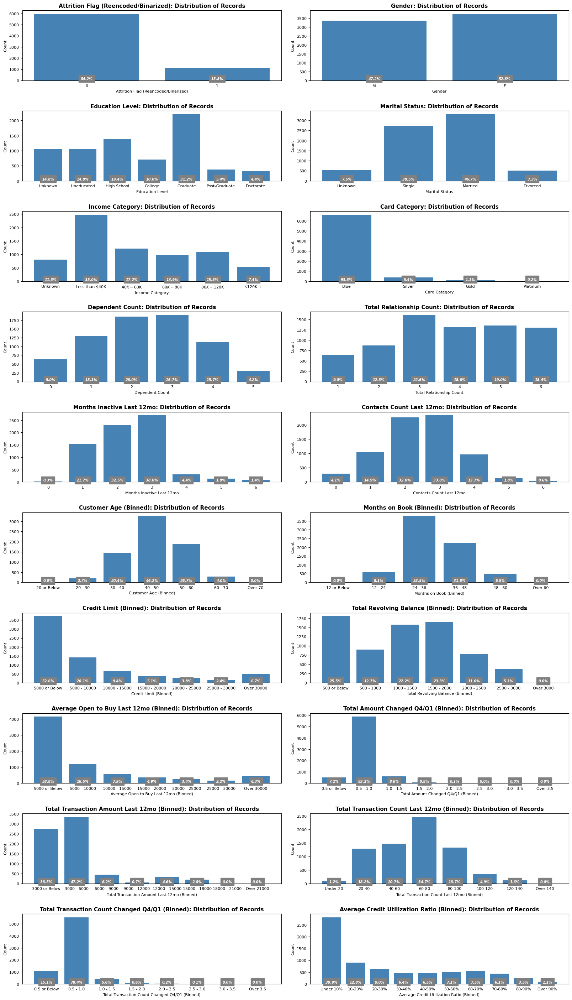

In [29]:
## Plotting: Generate univariate distributions for target and feature variables

# Define dimensions for figure subplots
fig_sp_rows = 10
fig_sp_cols = 2

# Define variable names for figure subplots
fig_vars = [
    "Attrition Flag (Reencoded/Binarized)", "Gender", "Education Level", "Marital Status",
    "Income Category", "Card Category", "Dependent Count", "Total Relationship Count",
    "Months Inactive Last 12mo", "Contacts Count Last 12mo", "Customer Age (Binned)",
    "Months on Book (Binned)", "Credit Limit (Binned)", "Total Revolving Balance (Binned)",
    "Average Open to Buy Last 12mo (Binned)", "Total Amount Changed Q4/Q1 (Binned)",
    "Total Transaction Amount Last 12mo (Binned)", "Total Transaction Count Last 12mo (Binned)",
    "Total Transaction Count Changed Q4/Q1 (Binned)", "Average Credit Utilization Ratio (Binned)"
]

# Define variable counts for figure subplots
fig_cols = [
    attrition_flag_RE_vcounts, gender_vcounts, education_level_vcounts, marital_status_vcounts,
    income_category_vcounts, card_category_vcounts, dependent_count_vcounts,
    total_relationship_count_vcounts, months_inactive_12mo_vcounts, contacts_count_12mo_vcounts,
    customer_age_binned_vcounts, months_on_book_binned_vcounts, credit_limit_binned_vcounts,
    total_revolving_bal_binned_vcounts, avg_open_to_buy_binned_vcounts,
    total_amt_chng_Q4_Q1_binned_vcounts, total_trans_amt_binned_vcounts,
    total_trans_ct_binned_vcounts, total_ct_chng_Q4_Q1_binned_vcounts,
    avg_utilization_ratio_binned_vcounts
]

# Create figure and axes to contain subplots
fig, axes = plt.subplots(nrows = fig_sp_rows, ncols = fig_sp_cols, figsize = (16, 28))

# Flatten axes object for iterating
axes = axes.flatten()

# Set default parameters for subplot labels/characteristics
fs = 8
fc = "white"
fw = "bold"
ft = "italic"
ha = "center"
va = "bottom"
bc = "gray"
mc = "steelblue"
fig_title_suffix = ": Distribution of Records"

# Generate figure subplots
for i, ax in enumerate(axes):
    if i == 0:
        x = fig_cols[i][0]
        y = fig_cols[i][1]
        ax.bar(x, y, color = mc)
        ax.set_xticks(attrition_flag_RE_order)
        ax.set_title(fig_vars[i] + fig_title_suffix, fontsize = fs + 3, fontweight = fw)
        ax.set_xlabel(fig_vars[i], fontsize = fs)
        ax.set_ylabel("Count", fontsize = fs)
        ax.tick_params(axis = "both", which = "major", labelsize = fs)
        for j, v in enumerate(fig_cols[i][1]):
            ax.text(j, 0, str("{:.1f}%").format(v / fig_cols[i][1].sum() * 100),
                      ha = ha, va = va, fontsize = fs - 1, fontweight = fw, fontstyle = ft,
                      color = fc, backgroundcolor = bc)
    else:
        x = fig_cols[i].index
        y = fig_cols[i].values
        ax.bar(x, y, color = mc)
        ax.set_title(fig_vars[i] + fig_title_suffix, fontsize = fs + 3, fontweight = fw)
        ax.set_xlabel(fig_vars[i], fontsize = fs)
        ax.set_ylabel("Count", fontsize = fs)
        ax.tick_params(axis = "both", which = "major", labelsize = fs)
        for j, v in enumerate(fig_cols[i].values):
            # Special handling required for one ordinal variable which begins with a 1 instead of 0
            if i == 7:
                ax.text(j + 1, 0, str("{:.1f}%").format(v / fig_cols[i].values.sum() * 100),
                      ha = ha, va = va, fontsize = fs - 1, fontweight = fw, fontstyle = ft,
                      color = fc, backgroundcolor = bc)
            else:
                ax.text(j, 0, str("{:.1f}%").format(v / fig_cols[i].values.sum() * 100),
                    ha = ha, va = va, fontsize = fs - 1, fontweight = fw, fontstyle = ft,
                    color = fc, backgroundcolor = bc)
        
# Display plots
plt.tight_layout(pad = 0.4, w_pad = 2.0, h_pad = 2.0)
plt.show()

##### Observations:
- The creation of binned variables in an earlier step help make some of the barplots cleaner.
- The Training set appears to be imbalanced with respect to the target variable (**`Attrition_Flag`**, or the reencoded version **`Attrition_Flag_RE`**). Roughly 16% of all records correspond to attrited customers. It's reasonable to conclude that this imbalance exists in the validation (dev) and testing sets as well, since the original raw dataset was shuffled prior to splitting. This imbalance will need to be addressed before setting up or training certain types of models (**`Part 3`**).
- Most variables do not appear to be normally distributed; many have long-tailed distributions. As a result, mean-based analyses across these variables may not be especially valuable on their own.
- We can start to build some intuition for which variables might be *less* helpful for our classification task by looking at those with an extremely high prevalence of data in one bin/category (e.g., **`Card_Category`** shows >93% of all records in the "Blue" category) or those with near-perfect balance across two bins/categories (e.g., **`Gender`** shows a ~47% to ~53% split between "Male" and "Female").

In [30]:
## Plotting: Create summary counts and grouped data for visualizations - features x target

# Create a function to compute crosstabs for object feature variables
def obj_crosstab(df, col_name, target_name, ordering):
    """Creates a crosstab of column/target counts within a dataframe and applies a set order to the output.

    Arguments:
    ----------
    df: Dataframe which contains column to be summarized in crosstab
    col_name: Name of column to be summarized in crosstab
    target_name: Name of target column to be interacted with column in crosstab
    ordering: List specifying the intended order for the resulting crosstab

    Returns:
    --------
    col_xtab: Crosstab for specified column interacted with target
    """
    # Creates crosstab of a column and target variable and sorts based on a specified order
    col_xtab = 100 * pd.crosstab(
        df[col_name],
        df[target_name],
        dropna = False,
        normalize = "columns").reindex(ordering)
    
    return col_xtab

In [31]:
## Plotting: Create summary counts and grouped data for visualizations - features x target

# Create a function to compute crosstabs for categorical/ordinal and binned feature variables
def cat_binned_crosstab(df, col_name, target_name):
    """
    Creates a crosstab of column/target counts within a dataframe and sorts the output.

    Arguments:
    ----------
    df: Dataframe which contains column to be summarized in crosstab
    col_name: Name of column to be summarized in crosstab
    target_name: Name of target column to be interacted with column in crosstab

    Returns:
    --------
    col_xtab: Crosstab for specified column interacted with target
    """
    # Creates crosstab of a column and target variable and sorts from lowest to highest column value
    col_xtab = 100 * pd.crosstab(
        df[col_name],
        df[target_name],
        dropna = False,
        normalize = "columns").sort_index()
    
    return col_xtab

In [32]:
## Plotting: Create summary counts and grouped data for visualizations - features x target

# Generate crosstabs for object feature variables
gender_xtab = obj_crosstab(X_train, "Gender", "Attrition_Flag_RE", gender_order)
education_level_xtab = obj_crosstab(X_train, "Education_Level", "Attrition_Flag_RE", education_level_order)
marital_status_xtab = obj_crosstab(X_train, "Marital_Status", "Attrition_Flag_RE", marital_status_order)
income_category_xtab = obj_crosstab(X_train, "Income_Category", "Attrition_Flag_RE", income_category_order)
card_category_xtab = obj_crosstab(X_train, "Card_Category", "Attrition_Flag_RE", card_category_order)

# Generate crosstabs for categorical/ordinal and engineered (binned) feature variables
dependent_count_xtab = cat_binned_crosstab(X_train, "Dependent_count", "Attrition_Flag_RE")
total_relationship_count_xtab = cat_binned_crosstab(X_train, "Total_Relationship_Count", "Attrition_Flag_RE")
months_inactive_12mo_xtab = cat_binned_crosstab(X_train, "Months_Inactive_12_mon", "Attrition_Flag_RE")
contacts_count_12mo_xtab = cat_binned_crosstab(X_train, "Contacts_Count_12_mon", "Attrition_Flag_RE")
customer_age_binned_xtab = cat_binned_crosstab(X_train, "Customer_Age_Binned", "Attrition_Flag_RE")
months_on_book_binned_xtab = cat_binned_crosstab(X_train, "Months_on_book_Binned", "Attrition_Flag_RE")
credit_limit_binned_xtab = cat_binned_crosstab(X_train, "Credit_Limit_Binned", "Attrition_Flag_RE")
total_revolving_bal_binned_xtab = cat_binned_crosstab(X_train, "Total_Revolving_Bal_Binned", "Attrition_Flag_RE")
avg_open_to_buy_binned_xtab = cat_binned_crosstab(X_train, "Avg_Open_To_Buy_Binned", "Attrition_Flag_RE")
total_amt_chng_Q4_Q1_binned_xtab = cat_binned_crosstab(X_train, "Total_Amt_Chng_Q4_Q1_Binned", "Attrition_Flag_RE")
total_trans_amt_binned_xtab = cat_binned_crosstab(X_train, "Total_Trans_Amt_Binned", "Attrition_Flag_RE")
total_trans_ct_binned_xtab = cat_binned_crosstab(X_train, "Total_Trans_Ct_Binned", "Attrition_Flag_RE")
total_ct_chng_Q4_Q1_binned_xtab = cat_binned_crosstab(X_train, "Total_Ct_Chng_Q4_Q1_Binned", "Attrition_Flag_RE")
avg_utilization_ratio_binned_xtab = cat_binned_crosstab(X_train, "Avg_Utilization_Ratio_Binned", "Attrition_Flag_RE")

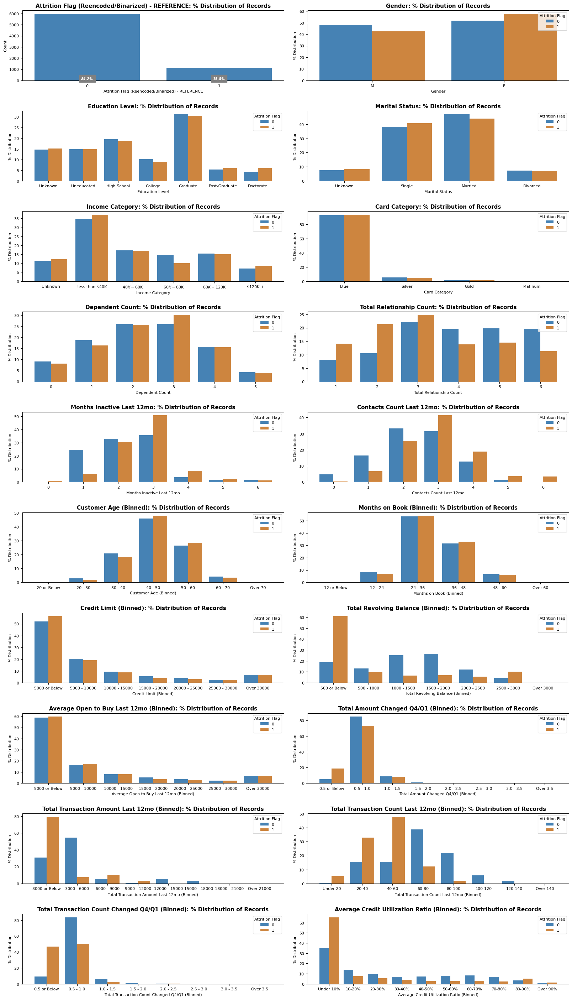

In [33]:
## Plotting: Generate bivariate distributions for feature variables, grouped by target variable

# Define dimensions for figure subplots
fig_sp_rows = 10
fig_sp_cols = 2

# Define variable names for figure subplots
fig_vars = [
    "Attrition Flag (Reencoded/Binarized) - REFERENCE", "Gender", "Education Level",
    "Marital Status", "Income Category", "Card Category", "Dependent Count",
    "Total Relationship Count", "Months Inactive Last 12mo", "Contacts Count Last 12mo",
    "Customer Age (Binned)", "Months on Book (Binned)", "Credit Limit (Binned)",
    "Total Revolving Balance (Binned)", "Average Open to Buy Last 12mo (Binned)",
    "Total Amount Changed Q4/Q1 (Binned)", "Total Transaction Amount Last 12mo (Binned)",
    "Total Transaction Count Last 12mo (Binned)", "Total Transaction Count Changed Q4/Q1 (Binned)",
    "Average Credit Utilization Ratio (Binned)"
]

# Define variable counts for figure subplots
fig_cols = [
    attrition_flag_RE_vcounts, gender_xtab, education_level_xtab, marital_status_xtab,
    income_category_xtab, card_category_xtab, dependent_count_xtab, total_relationship_count_xtab,
    months_inactive_12mo_xtab, contacts_count_12mo_xtab, customer_age_binned_xtab,
    months_on_book_binned_xtab, credit_limit_binned_xtab, total_revolving_bal_binned_xtab,
    avg_open_to_buy_binned_xtab, total_amt_chng_Q4_Q1_binned_xtab, total_trans_amt_binned_xtab,
    total_trans_ct_binned_xtab, total_ct_chng_Q4_Q1_binned_xtab, avg_utilization_ratio_binned_xtab
]

# Create figure and axes to contain subplots
fig, axes = plt.subplots(nrows = fig_sp_rows, ncols = fig_sp_cols, figsize = (16, 28))

# Flatten axes object for iterating
axes = axes.flatten()

# Set default parameters for subplot labels/characteristics
fs = 8
bw = 0.8
fc = "white"
fw = "bold"
ft = "italic"
ha = "center"
va = "bottom"
bc = "gray"
mc = "steelblue"
sc = ["steelblue", "peru"]
fig_title_suffix = ": % Distribution of Records"

# Generate figure subplots
for i, ax in enumerate(axes):
    if i == 0:
        x = fig_cols[i][0]
        y = fig_cols[i][1]
        ax.bar(x, y, color = mc)
        ax.set_xticks(attrition_flag_RE_order)
        ax.set_title(fig_vars[i] + fig_title_suffix, fontsize = fs + 3, fontweight = fw)
        ax.set_xlabel(fig_vars[i], fontsize = fs)
        ax.set_ylabel("Count", fontsize = fs)
        ax.tick_params(axis = "both", which = "major", labelsize = fs)
        for j, v in enumerate(fig_cols[i][1]):
            ax.text(j, 0, str("{:.1f}%").format(v / fig_cols[i][1].sum() * 100),
                      ha = ha, va = va, fontsize = fs - 1, fontweight = fw, fontstyle = ft,
                      color = fc, backgroundcolor = bc)
    else:
        bars = len(fig_cols[i].columns)
        bar_width = bw / bars
        positions = np.arange(len(fig_cols[i].index))
        for j, col in enumerate(fig_cols[i].columns):
            ax.bar(positions + j * bar_width, fig_cols[i][col], width = bar_width, label = col, color = sc[j])
        ax.set_xticks(positions + (bars - 1) / 2 * bar_width)
        ax.set_xticklabels(fig_cols[i].index)
        ax.set_title(fig_vars[i] + fig_title_suffix, fontsize = fs + 3, fontweight = fw)
        ax.set_xlabel(fig_vars[i], fontsize = fs)
        ax.set_ylabel("% Distribution", fontsize = fs)
        ax.tick_params(axis = "both", which = "major", labelsize = fs)
        ax.legend(loc = "upper right", fontsize = fs, facecolor = fc, title = "Attrition Flag",
                  title_fontsize = fs)
        
# Display plots
plt.tight_layout(pad = 0.4, w_pad = 2.0, h_pad = 2.0)
plt.show()

##### Observations:
- These barplots provide an extra layer of valuable information that the previous plots did not. We can now see how distributions differ between attrited and non-attrited customers.
- For several variables, we see no clear differences between attrited and non-attrited customers, which continues to help us build an intuition around which variables/features might be *less* helpful for our classification task before running any feature importance plots or model diagnostics (e.g., **`Gender`**, **`Education_Level`**, **`Card_Category`**, etc.).
- Some of the most noteworthy distribution differences appear in the following variables: **`Total_Relationship_Count`**, **`Months_Inactive_12_mon`**, **`Contacts_Count_12_mon`**, **`Total_Revolving_Bal`**, **`Total_Trans_Amt`**, **`Total_Trans_Ct`**, and **`Avg_Utilization_Ratio`**. This list of variables/features may have uniquely high feature importance when we train and investigate our models (**`Part 3`**).

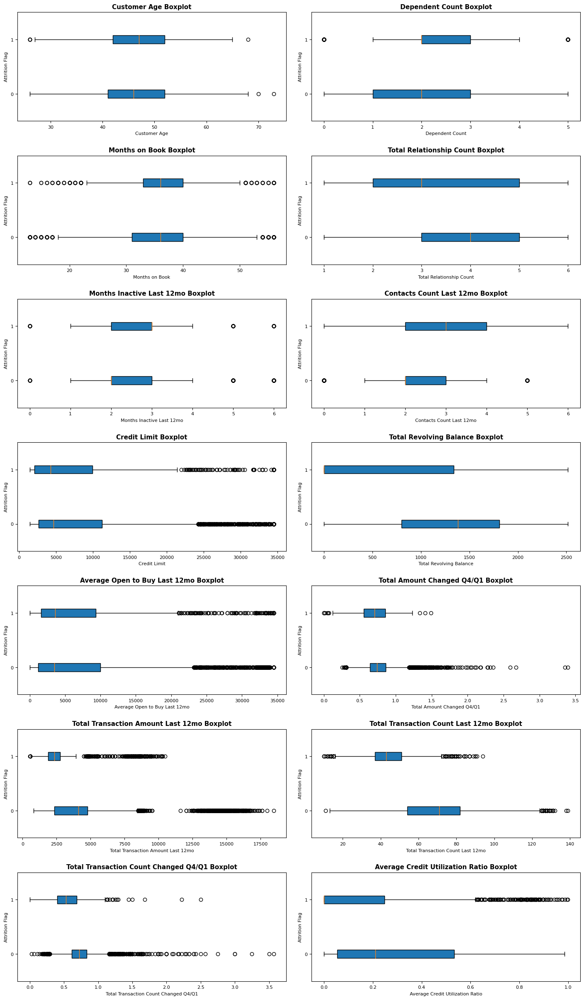

In [34]:
## Plotting: Generate box-plots for key numeric feature variables, grouped by target variable

# Define dimensions for figure subplots
fig_sp_rows = 7
fig_sp_cols = 2

# Define variable names for figure subplots
fig_vars = [
    "Customer Age", "Dependent Count", "Months on Book", "Total Relationship Count",
    "Months Inactive Last 12mo", "Contacts Count Last 12mo", "Credit Limit",
    "Total Revolving Balance", "Average Open to Buy Last 12mo", "Total Amount Changed Q4/Q1",
    "Total Transaction Amount Last 12mo", "Total Transaction Count Last 12mo",
    "Total Transaction Count Changed Q4/Q1", "Average Credit Utilization Ratio"
]

# Define variables for figure subplots
plot_cols = [
    "Customer_Age","Dependent_count", "Months_on_book", "Total_Relationship_Count",
    "Months_Inactive_12_mon", "Contacts_Count_12_mon", "Credit_Limit",
    "Total_Revolving_Bal", "Avg_Open_To_Buy", "Total_Amt_Chng_Q4_Q1",
    "Total_Trans_Amt", "Total_Trans_Ct", "Total_Ct_Chng_Q4_Q1", "Avg_Utilization_Ratio",
    "Attrition_Flag_RE"
]
variables = X_train[plot_cols]

# Create figure and axes to contain subplots
fig, axes = plt.subplots(nrows = fig_sp_rows, ncols = fig_sp_cols, figsize = (14, 24))

# Flatten axes object for iterating
axes = axes.flatten()

# Set default parameters for subplot labels/characteristics
fs = 8
fw = "bold"
fig_title_suffix = " Boxplot"

# Generate figure subplots
for i, ax in enumerate(axes):
    group = variables.groupby("Attrition_Flag_RE")[variables.columns[i]]
    ax.boxplot(
        [group.get_group(0), group.get_group(1)],
        labels = attrition_flag_RE_order,
        patch_artist = True,
        vert = False
    )
    ax.set_title(fig_vars[i] + fig_title_suffix, fontsize = fs + 3, fontweight = fw)
    ax.set_xlabel(fig_vars[i], fontsize = fs)
    ax.set_ylabel("Attrition Flag", fontsize = fs)
    ax.tick_params(axis = "both", which = "major", labelsize = fs)
        
# Display plots
plt.tight_layout(pad = 0.4, w_pad = 2.0, h_pad = 2.0)
plt.show()

##### Observations:
- These boxplots provide us with another way of looking at the distributions of *numeric* (non-categorical) variables in our training set, without any binning/grouping.
- Like the second round of barplots (above), these plots show distributions for attrited and non-attrited customers, which help us see where distributions differ meaningfully across our target variable. 
- They reinforce some of the key findings or take-aways from the previous barplot visuals –– specifically the significance of variables like **`Total_Relationship_Count`**, **`Months_Inactive_12_mon`**, **`Contacts_Count_12_mon`**, **`Total_Revolving_Bal`**, **`Total_Trans_Amt`**, **`Total_Trans_Ct`**, and **`Avg_Utilization_Ratio`**, which show markedly different distributions (as well as medians and IQRs) for attrited and non-attrited customers.
- These plots also help us identify outliers –– or potential outliers –– for customized treatment/handling (dots at the tail ends of the "whiskers"). At this stage, we do not plan to remove any outliers or impute data for them given the original size of the raw dataset and resulting sizes of the training, validation (dev), and testing sets.

In [35]:
## Plotting: Compare mean, median, and standard deviations across features and target variable

# Define list of columns for grouping in summary tables
summary_table_cols = [
    "Customer_Age", "Dependent_count", "Months_on_book", "Total_Relationship_Count",
    "Months_Inactive_12_mon", "Contacts_Count_12_mon", "Credit_Limit", "Total_Revolving_Bal",
    "Avg_Open_To_Buy", "Total_Amt_Chng_Q4_Q1", "Total_Trans_Amt", "Total_Trans_Ct",
    "Total_Ct_Chng_Q4_Q1", "Avg_Utilization_Ratio"
]

# Create mean summary table
mean_summary_table = X_train.groupby("Attrition_Flag_RE")[summary_table_cols].mean()
print("Mean Summary Table: Features and Target (Training Set)")
display(mean_summary_table)

# Add spacer
print("=" * 100, "\n")

# Create median summary table
median_summary_table = X_train.groupby("Attrition_Flag_RE")[summary_table_cols].median()
print("Median Summary Table: Features and Target (Training Set)")
display(median_summary_table)

# Add spacer
print("=" * 100, "\n")
    
# Create standard deviation summary table
std_summary_table = X_train.groupby("Attrition_Flag_RE")[summary_table_cols].std()
print("Standard Deviation Summary Table: Features and Target (Training Set)")
display(std_summary_table)

Mean Summary Table: Features and Target (Training Set)


,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Attrition_Flag_RE,,,,,,,,,,,,,,
0,46.328923,2.334282,35.964328,3.914755,2.285882,2.349858,8794.779116,1258.916094,7535.863021,0.770364,4650.355719,68.66488,0.742511,0.296686
1,46.845121,2.404655,36.275739,3.272158,2.710833,2.965980,8224.866517,686.385855,7538.480662,0.696241,3070.979409,44.68308,0.553705,0.166539



Median Summary Table: Features and Target (Training Set)


,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Attrition_Flag_RE,,,,,,,,,,,,,,
0,46.0,2.0,36.0,4.0,2.0,2.0,4675.0,1380.0,3495.0,0.741,4096.0,71.0,0.722,0.211
1,47.0,2.0,36.0,3.0,3.0,3.0,4259.0,0.0,3578.0,0.703,2329.0,43.0,0.531,0.000



Standard Deviation Summary Table: Features and Target (Training Set)


,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Attrition_Flag_RE,,,,,,,,,,,,,,
0,8.088394,1.308955,8.053313,1.533851,1.025226,1.087476,9169.581345,758.814000,9171.084863,0.217005,3518.154195,23.177122,0.230557,0.273464
1,7.628952,1.267563,7.602765,1.564980,0.912674,1.099327,9148.468718,929.118616,9169.896955,0.211697,2295.329722,14.660122,0.232043,0.268944


##### Observations:
- These views offer a similar level of detail as the barplots and boxplots above, yet provide the actual summary statistics/numbers behind some of the conclusions drawn from (or inferred by) these visuals.
- They indicate that attrited customers tend to have lower credit limits, lower balances, lower transaction amounts and counts, and lower credit utilization ratios than non-attrited customers. They also suggest that there's no clear or consistent age profile for an attrited customer.

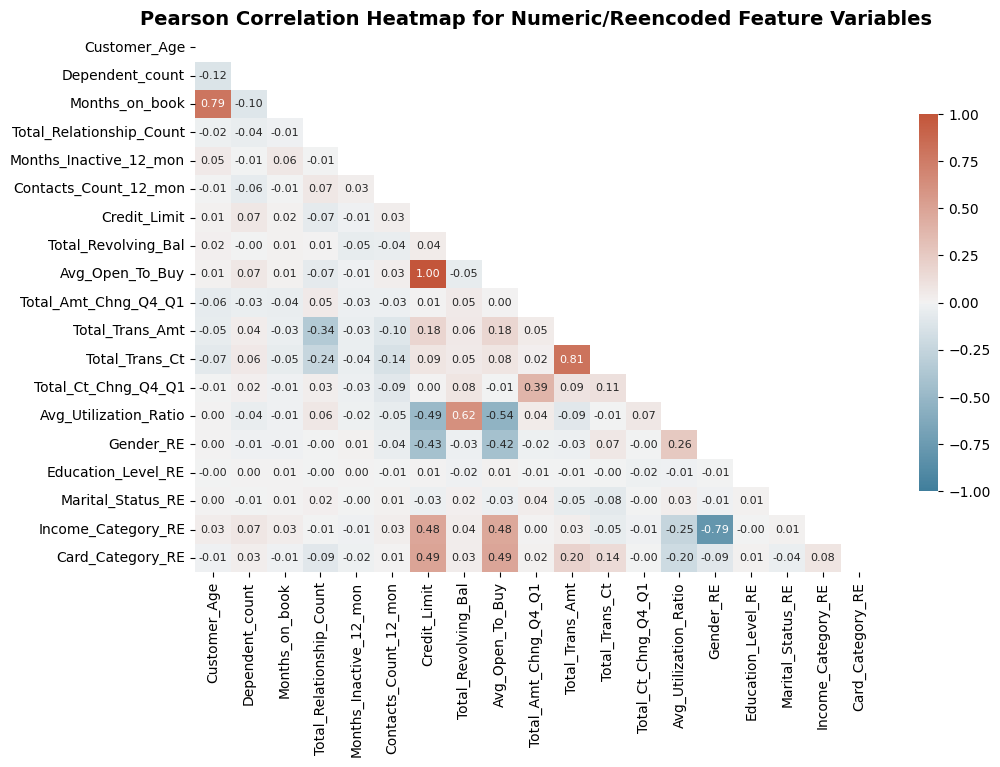

In [36]:
## Visualizations: Examine correlation coefficients for all numeric/reencoded features

# Define numeric/reencoded columns
num_cols = [
    "Customer_Age","Dependent_count", "Months_on_book", "Total_Relationship_Count",
    "Months_Inactive_12_mon", "Contacts_Count_12_mon", "Credit_Limit", "Total_Revolving_Bal",
    "Avg_Open_To_Buy", "Total_Amt_Chng_Q4_Q1", "Total_Trans_Amt", "Total_Trans_Ct",
    "Total_Ct_Chng_Q4_Q1", "Avg_Utilization_Ratio", "Gender_RE", "Education_Level_RE",
    "Marital_Status_RE", "Income_Category_RE", "Card_Category_RE"
]

# Calculate a correlation matrix for all numeric/reencoded data
X_train_corr_matrix = X_train[num_cols].corr()

# Set default parameters for plot labels/characteristics
fs = 8
fw = "bold"

# Create a heatmap showing all pairwise correlation coefficients
plt.figure(figsize = (11, 7))
mask = np.triu(np.ones_like(X_train_corr_matrix, dtype = bool))
cmap = sns.diverging_palette(230, 20, as_cmap = True)
sns.heatmap(X_train_corr_matrix, mask = mask, annot = True, fmt = ".2f",
            cmap = cmap, annot_kws = {"fontsize": 8}, vmin = -1, vmax = 1,
            cbar_kws = {"shrink": 0.7})
plt.title("Pearson Correlation Heatmap for Numeric/Reencoded Feature Variables",
          fontsize = fs + 6, fontweight = fw)

# Display heatmap
plt.show()

##### Observations:
- This heatmap provides us with another way to examine key relationships between feature variables (along with the target variable) in our dataset.
- Only a few variable pairs have large/strong (>0.50) positive or negative correlations:
    - Large Positive Correlations:
        - **`Avg_Open_To_Buy`** with **`Credit_Limit`** (r = +1.00)
        - **`Total_Trans_Ct`** with **`Total_Trans_Amt`** (r = +0.81)
        - **`Months_on_book`** with **`Customer_Age`** (r = +0.79)
        - **`Avg_Utilization_Ratio`** with **`Total_Revolving_Bal`** (r = +0.62)
    - Large Negative Correlations:
        - **`Gender_RE`** with **`Income_Category_RE`** (r = -0.79)
        - **`Avg_Utilization_Ratio`** with **`Avg_Open_To_Buy`** (r = -0.54)
- All other variable pairs have either medium/moderate (0.30 - 0.50) or small/weak (<0.30) correlations.
- Feature redundancy (with respect to modeling) is especially likely for variable pairs with strong positive pairwise correlations.

Pairplot 1: Relationships Between Select Numeric/Reencoded Features


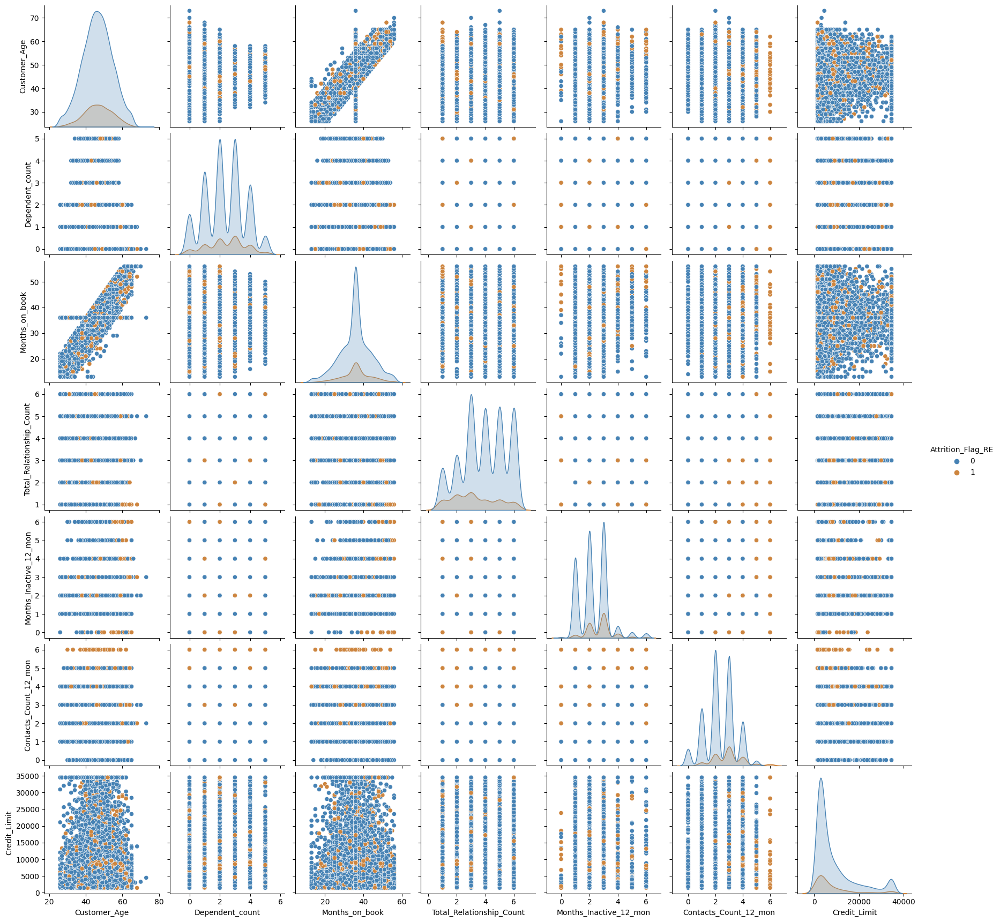


Pairplot 2: Relationships Between Select Numeric/Reencoded Features


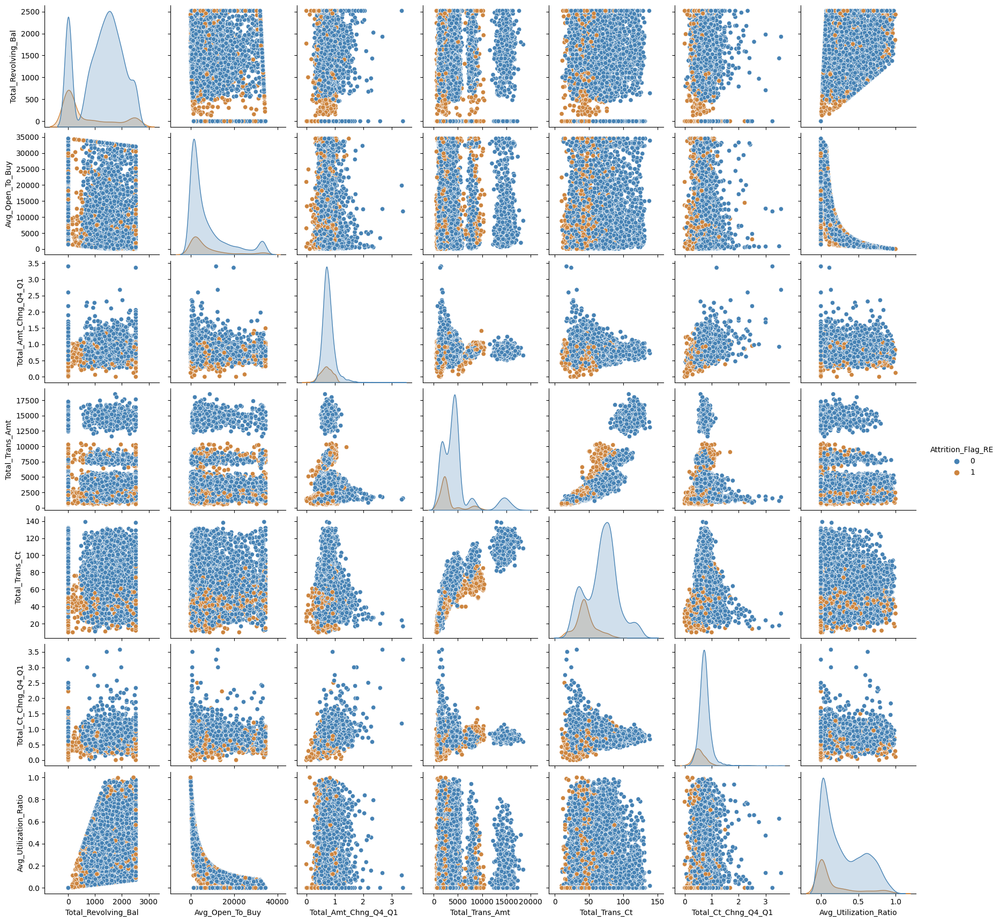

In [37]:
## Plotting: Generate paired distributions for numeric/reencoded features

# Retain only numeric/reencoded columns for pairplots (split into two groups)
pp_cols_1 = [
    "Attrition_Flag_RE", "Customer_Age", "Dependent_count", "Months_on_book",
    "Total_Relationship_Count", "Months_Inactive_12_mon", "Contacts_Count_12_mon",
    "Credit_Limit"
]

pp_cols_2 = [
    "Attrition_Flag_RE", "Total_Revolving_Bal", "Avg_Open_To_Buy", "Total_Amt_Chng_Q4_Q1",
    "Total_Trans_Amt", "Total_Trans_Ct", "Total_Ct_Chng_Q4_Q1", "Avg_Utilization_Ratio"
]

# Set default parameters for pairplot labels/characteristics
fs = 8
fw = "bold"

# Define color palette and theme/style for pairplots
colors = {0: "steelblue", 1: "peru"}

# Create and display first pairplot showing relationships and distributions across select features
print("Pairplot 1: Relationships Between Select Numeric/Reencoded Features")
sns.pairplot(X_train[pp_cols_1], hue = "Attrition_Flag_RE", palette = colors)
plt.show()

# Add spacer
print("=" * 100, "\n")

# Create and display second pairplot showing relationships and distributions across select features
print("Pairplot 2: Relationships Between Select Numeric/Reencoded Features")
sns.pairplot(X_train[pp_cols_2], hue = "Attrition_Flag_RE", palette = colors)
plt.show()

##### Observations:
- All numeric or reencoded variables/features are displayed in either the first or second pairplot, along with our target variable.
- A number of variables/features included in the first pairplot are ordinal, so the scatterplot visualizations containing these variables are somewhat less useful for analysis.
- Meanwhile, the second pairplot contains many metric (ratio/interval) variables/features. Again, confirming the take-aways from prior visualizations, this second pairplot suggest that attrited customers generally have lower transaction counts, lower transaction amounts, and lower utilization ratios than non-attrited customers.

### `[2.D] Perform PCA to Evaluate Dimensionality Reductions`

In [38]:
## DR & PCA: Process data for Principal Component Analysis (PCA)

# Drop all non-numeric columns/features from training set
X_train_trunc = X_train.select_dtypes(include = ["int", "float"])
X_train_trunc.drop("Attrition_Flag_RE", axis = 1, inplace = True)

# View truncated training set for PCA
print(X_train_trunc.columns, "\n\n", "Total Columns:", len(X_train_trunc.columns))

Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Gender_RE', 'Education_Level_RE', 'Marital_Status_RE',
       'Income_Category_RE', 'Card_Category_RE'],
      dtype='object') 

 Total Columns: 19


In [39]:
## DR & PCA: Process data for Principal Component Analysis (PCA)

# Apply standard scaling to training set for PCA process (scaling = zero mean and unit variance)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_trunc)

In [40]:
## DR & PCA: Perform Principal Component Analysis (PCA) - trial #1

# Set parameters for PCA process
components = 2
pca_1 = PCA(n_components = components)

# Fit and transform scaled data to new coordinate system (reduced dimensions)
X_train_pca_1 = pca_1.fit_transform(X_train_scaled)

# Show outcome of PCA dimensionality reduction in rows/columns of PCA dataset
print("Original Dimensions of Truncated Training Dataset:", X_train_trunc.shape)
print(f"Reduced Dimensions of PCA Dataset (Trial #1 - {components}D):", X_train_pca_1.shape)

Original Dimensions of Truncated Training Dataset: (7088, 19)
Reduced Dimensions of PCA Dataset (Trial #1 - 2D): (7088, 2)


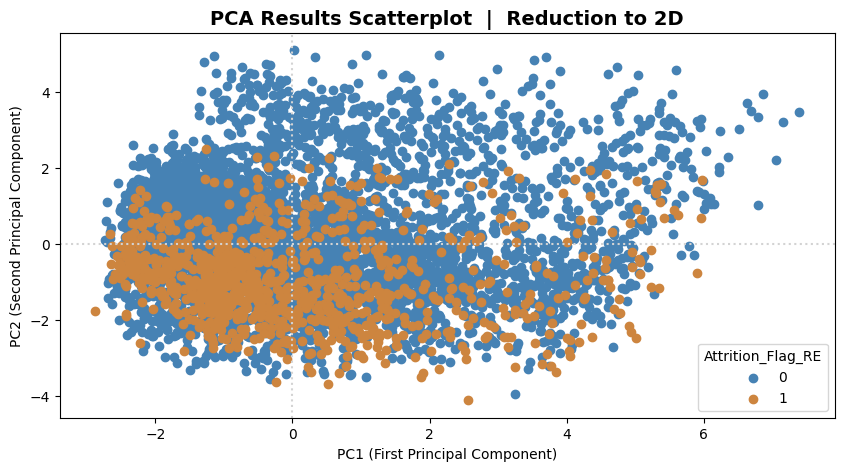

In [41]:
## DR & PCA: Show results of Principal Component Analysis (PCA) - trial #1

# Set default parameters for PCA plot labels/characteristics
fs = 8
fw = "bold"
sc = ["steelblue", "peru"]

# Generate scatterplot showing target variable distribution across newly created features (from PCA)
plt.figure(figsize = (10, 5))
for i, flag in enumerate(X_train["Attrition_Flag_RE"].unique()):
    plt.scatter(X_train_pca_1[X_train["Attrition_Flag_RE"] == flag, 0], 
                X_train_pca_1[X_train["Attrition_Flag_RE"] == flag, 1], 
                color = sc[i],
                label = flag)
plt.axvline(x = 0, color = "lightgray", linestyle = "dotted")
plt.axhline(y = 0, color = "lightgray", linestyle = "dotted")
plt.xlabel("PC1 (First Principal Component)")
plt.ylabel("PC2 (Second Principal Component)")
plt.title(f"PCA Results Scatterplot  |  Reduction to {components}D",
          fontsize = fs + 6,
          fontweight = fw)
plt.legend(loc = "lower right",
           title = "Attrition_Flag_RE")

# Display plot
plt.show()

##### Observations:
- As a final EDA step, we performed Principal Component Analysis (PCA) to look for potential areas of simplification through dimensionality reduction.
- This first round of PCA reduces the dimensionality of our feature set from 19 to 2, so that the resulting/new features created by the PCA process can be easily plotted on a 2D scatterplot.
- The results of this PCA are unsatisfactory. In the scatterplot, we do not see the level of separation between attrited and non-attrited customers necessary to proceed with model training on the 2 new PCA-generated features alone.
- These results suggest that more features/components than 2 are necessary to explain a sufficient degree of the variability in the data. This means that we'll need to preserve some (or most) of the higher-dimensionality contained in the original data for efficient and effective model training and performance.

In [42]:
## DR & PCA: Perform Principal Component Analysis (PCA) - trial #2

# Set parameters for PCA process
v_preservation_rate = 0.95
pca_2 = PCA(v_preservation_rate)

# Fit and transform scaled data to new coordinate system (reduced dimensions)
X_train_pca_2 = pca_2.fit_transform(X_train_scaled)

# Show outcome of PCA dimensionality reduction in rows/columns of PCA dataset
print("Original Dimensions of Truncated Training Dataset:", X_train_trunc.shape)
print(f"Reduced Dimensions of PCA Dataset (Trial #2 - {v_preservation_rate * 100:.1f}% Variability Preserved):",
      X_train_pca_2.shape)

Original Dimensions of Truncated Training Dataset: (7088, 19)
Reduced Dimensions of PCA Dataset (Trial #2 - 95.0% Variability Preserved): (7088, 14)


##### Observations:
- We built on our previous PCA test with a second run –– this time using a "variability preservation rate" parameter (i.e., how much of the variability in the data do we want to preserve through PCA) rather than a "number of components" parameter.
- This second round of PCA reduces the dimensionality of our feature set from 19 to 14 when using a 95% variability preservation rate. This means that the total variability in the training set is explained by *many* of the variables/features in the data, and not just by a small handful. 
- The results of this second PCA run help corroborate our last take-away from the first PCA run. Because a higher number of dimensions/features than 3 is indicated by the PCA to preserve 95% of the variability in the data, we cannot easily visualize or plot the new 14-dimension feature space generated by the analysis. These results also suggest that we should preserve a large number of features within model training to optimize performance.

### `[2.E] Part 2 Summary`
- We examined summary statistics for our numeric and categorical features.
- We reencoded several object columns as numeric to assist with EDA and (later on) model development.
- We performed additional feature engineering (e.g., binning) to help with analysis and interpretability of EDA results.
- We generated a variety of plots and tables, with differing levels of granularity, to help visualize the data.
- We began to identify key feature x target and feature x feature relationships, including correlations.
- We also began to develop an intuition for which variables/features might be non-meaningful in modeling.
- We used PCA to explore whether or not dimensionality reduction could assist with model feature selection or conceptualization.
- We are now ready to move forward with model development, training, validation, and testing (**`Part 3`**).
- Note: We may complete additional "data preprocessing" later on, subject to the needs of each modeling approach tested.

------------------------------------------------------------------------------------------------------------------

## ====================================================================
## Part 3: Model Development and Training
**Objective:** Develop, train, and evaluate a suite of classification models that predict customer attrition, using validation set for model tuning.
## ====================================================================

***References Cited:***
* The best machine learning model for binary classification: https://ruslanmv.com/blog/The-best-binary-Machine-Learning-Model
* 8 Tactics to Combat Imbalanced Classes in Your Machine Learning Dataset: https://machinelearningmastery.com/tactics-to-combat-imbalanced-classes-in-your-machine-learning-dataset/
* Deep Learning Tuning Playbook: https://github.com/google-research/tuning_playbook

### `[3.A] Feature Selection and Data Imbalance Correction for Modeling`

In [43]:
## Imbalance Handling: Data shows imbalance by unequal distribution of records across target variable

# Define list of original features/variables
features_0 = [
    "Customer_Age", "Gender", "Dependent_count", "Education_Level", "Marital_Status",
    "Income_Category", "Card_Category", "Months_on_book", "Total_Relationship_Count",
    "Months_Inactive_12_mon", "Contacts_Count_12_mon", "Credit_Limit", "Total_Revolving_Bal",
    "Avg_Open_To_Buy", "Total_Amt_Chng_Q4_Q1", "Total_Trans_Amt", "Total_Trans_Ct",
    "Total_Ct_Chng_Q4_Q1", "Avg_Utilization_Ratio"
]

# Define list of selected features for modeling based on EDA and inter-variable correlations/redundancy
features_1 = [
    "Total_Trans_Ct", "Total_Trans_Amt", "Total_Revolving_Bal", "Total_Relationship_Count",
    "Total_Amt_Chng_Q4_Q1", "Total_Ct_Chng_Q4_Q1", "Marital_Status", "Gender",
    "Months_Inactive_12_mon", "Customer_Age"
]

# Define class/target names
class_targets = ["Attrited_Customer", "Existing_Customer"]

# One-hot encode categorical features/variables
X_train_f1 = pd.get_dummies(X_train[features_1])
X_dev_f1 = pd.get_dummies(X_dev[features_1])
X_test_f1 = pd.get_dummies(X_test[features_1])

# Resample training set using Random Oversampling method
os = RandomOverSampler(random_state = 42)
X_train_rsos, y_train_rsos = os.fit_resample(X_train_f1, y_train)
print("Results using Random Oversampling:\n")
print("Before resampling:")
print(y_train.value_counts())
print("\nAfter resampling:")
print(y_train_rsos.value_counts())

# Add spacer
print("=" * 50, "\n")

# Resample training set using Synthetic Minority Oversampling Technique (SMOTE)
sm = SMOTE(random_state = 42)
X_train_rssm, y_train_rssm = sm.fit_resample(X_train_f1, y_train)
print("Results using SMOTE:\n")
print("Before resampling:")
print(y_train.value_counts())
print("\nAfter resampling:")
print(y_train_rssm.value_counts())

Results using Random Oversampling:

Before resampling:
0    5971
1    1117
Name: Attrition_Flag, dtype: int64

After resampling:
0    5971
1    5971
Name: Attrition_Flag, dtype: int64

Results using SMOTE:

Before resampling:
0    5971
1    1117
Name: Attrition_Flag, dtype: int64

After resampling:
0    5971
1    5971
Name: Attrition_Flag, dtype: int64


##### Observations:  
- The imbalance in our training set appears to have been addressed by Random Oversampling and SMOTE methods. We will evaluate which of these methods provides a better correction to the imbalanced data in model training.
- We will also consider the application of class weights as another technique within model training (at least for select models).
- We have chosen not to implement/examine Random Undersampling due to the small size of our training set.

### `[3.B] Create Dataframe for Storing Model Performance Metrics`

In [44]:
# Define columns for dataframe to store performance metrics for all models
columns = [
    "Model Name", "Accuracy (Train)", "Accuracy (Dev)", "Precision (Train)", "Precision (Dev)",
    "Recall (Train)", "Recall (Dev)"
]

# Instantiate empty dataframe to house model metrics
df_results = pd.DataFrame(columns = columns)

In [45]:
# Create function to store the performance metrics for a specified model
def eval_metrics_model(model_name, model, train_data, train_target, dev_data, dev_target, cv = 5):
    """Used with sklearn models. Plots the model score across training data samples, stores final evaluation
    metrics in `df_results`, and prints final evaluation metrics.

    Arguments:
    ----------
    model_name: Model name to be given
    model: Model to be evaluated
    train_data: Features from training set
    train_target: Targets from training set
    dev_data: Features from validation set
    dev_target: Targets from validation set
    cv = Cross-validation splitting strategy for learning curve (N-fold cross-validation, where cv = N)

    Returns:
    --------
    Stores evalution metrics (Accuracy, Precision, and Recall) for training and validation (dev) sets
    Prints evaluation metrics for the specific model and plots learning history
    """
    # KEY METRIC REFERENCE:
    # Accuracy = (TP + TN) / (TP + TN + FP + FN)
    # Precision = TP / (TP + FP)
    # Recall = TP / (TP + FN)
    # F1 Score = 2 * (Precision * Recall) / (Precision + Recall)
    
    # Establish global dataframe object to store model results
    global df_results
    
    # Define components for learning curve plot
    train_sizes, train_scores, valid_scores = learning_curve(
        model, train_data, train_target, cv = cv, train_sizes = np.linspace(0.1, 1.0, 10)
    )
    
    # Calculate the mean and standard deviation of the training and validation scores
    train_scores_mean = np.mean(train_scores, axis = 1)
    train_scores_std = np.std(train_scores, axis = 1)
    valid_scores_mean = np.mean(valid_scores, axis = 1)
    valid_scores_std = np.std(valid_scores, axis = 1)
    
    # Create learning curve plot
    plt.figure()
    plt.title("Learning Curve: " + model_name)
    plt.xlabel("Training Examples")
    plt.ylabel("Score (Accuracy)")
    plt.ylim(0.0, 1.1)
    # plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
    #                  train_scores_mean + train_scores_std, alpha = 0.1, color = "black")
    # plt.fill_between(train_sizes, valid_scores_mean - valid_scores_std,
    #                  valid_scores_mean + valid_scores_std, alpha = 0.1, color = "red")
    plt.plot(train_sizes, train_scores_mean, color = "black",label = "Train Score")
    plt.plot(train_sizes, valid_scores_mean, color = "red", label = "Validation (CV) Score")
    plt.legend(loc = "lower right")
    plt.show()

    # Evaluate model on training set
    train_pred = model.predict(train_data)
    train_accuracy = accuracy_score(train_target, train_pred)
    train_precision = precision_score(train_target, train_pred)
    train_recall = recall_score(train_target, train_pred)

    # Evaluate model on validation (dev) set
    dev_pred = model.predict(dev_data)
    dev_accuracy = accuracy_score(dev_target, dev_pred)
    dev_precision = precision_score(dev_target, dev_pred)
    dev_recall = recall_score(dev_target, dev_pred)

    # Store results in global dataframe and print dataframe
    new_model = {
        "Model Name": model_name,
        "Accuracy (Train)": train_accuracy, "Accuracy (Dev)": dev_accuracy,
        "Precision (Train)": train_precision, "Precision (Dev)": dev_precision,
        "Recall (Train)": train_recall, "Recall (Dev)": dev_recall
    }
    df_results = pd.concat([df_results, pd.DataFrame(new_model, index = [0])], ignore_index = True)
    print(df_results.iloc[-1, :])

##### Observations:
- In our initial model review phase, each model will be evaluated on Accuracy, Precision, and Recall, and F1 Score (which will be computed in a later step based on Precision and Recall results).  
- For imbalanced datasets, it is important to evaluate a model on multiple metrics, not just Accuracy (which could yield misleading conclusions).  
- Given that our main objective is to build a model to predict credit card customer attrition (as defined in **`Background and Problem Description`**), if we have to err, we may err on the side of slightly higher *Recall* than *Precision*. This is because we want our model to be highly sensitive to the characteristics of attrited customers and even run the risk generating a higher number of "false positives" (i.e., misclassify some existing customers as attrited) than "false negatives" (i.e., misclassify some attrited customers as existing) to prompt customer-saving actions. A high Recall rate would mean that a model is correctly identifying the majority of attrited customers. To a certain degree, we'd rather "over-flag" this group than "under-flag" it.
- At the same time, we'd like to ensure that our model has a reasonable level of Precision to avoid wasting resources on incorrectly identified customers. To that end, although we may trade *some* Precision for Recall as we perform model training and tuning, we'll still try to maintain a good balance between these metrics for optimal performance and business impact.

##### Note:
The following models are given names in this format:

**`Model Type [Code Package][Resampling Method][Scaling Method][Hyperparameter Tuning]`**,

with the bracketed components defined this way:
- **[Code Package]**
    - [S] = sklearn
    - [T] = Tensorflow
    - [.] = none
- **[Resampling Method]**
    - [RO] = random oversampling
    - [SMOTE] = SMOTE
    - [CW] = class weights
    - [.] = none (imbalanced)
- **[Scaling Method]**
    - [N] = normalization
    - [.] = none
- **[Hyperparameter Tuning]**
    - [HT] = tuned
    - [.] = none (default/non-optimized tuning)

(*Note: Ensembled models may contain multiple values in the bracketed components, which are separated by a | character.)

For example, a model with the name _"Logistic Regression [S][RO][N][.]"_ describes a
- logistic regression model
- run on sklearn [S]
- with random oversampling [RO]
- and normalization [N]
- and no hyperparameter tuning [.]

### `[3.C] Establish Baseline Models`

In [46]:
## Define Baseline Model 1: Predicts no attrition

# Expected results: High Accuracy, low Precision, low Recall, low business value
def majority_baseline(x):
    return 0 # corresponds to "Existing Customer"

In [47]:
# Calculate threshold for Baseline Model 2 using transaction count (single feature to explain target variable)
threshold = X_train.groupby("Attrition_Flag")["Total_Trans_Ct"].mean()
print("Average Number of Transactions (Threshold):")
print(round(threshold, 0))

Average Number of Transactions (Threshold):
Attrition_Flag
Attrited Customer    45.0
Existing Customer    69.0
Name: Total_Trans_Ct, dtype: float64


In [48]:
## Define Baseline Model 2: Predicts customers with total transactions below certain threshold will attrit

# Expected results: Moderate Accuracy, moderate Precision, moderate Recall, moderate business value
def rule_baseline(x):
    if x["Total_Trans_Ct"] < 45: # corresponds to mean transaction count calculated in preceding step
        return 1 # corresponds to "Attrited Customer"
    else:
        return 0 # corresponds to "Existing Customer"

In [49]:
# Create a function to store the performance metrics for the Baseline Models
def calculate_metrics(y_pred, y_true):
    """Calculates Accuracy, Precision, and Recall metrics given predicted and true targets.

    Arguments:
    ----------
    y_pred: Predicted targets
    y_true: True targets

    Returns:
    --------
    Accuracy, Precision, and Recall metrics
    """
    # Define true positives (TP), false positives (FP), true negatives (TN), and false negatives (FN)
    TP = np.sum((y_pred == 1) & (y_true == 1))
    FP = np.sum((y_pred == 1) & (y_true == 0))
    TN = np.sum((y_pred == 0) & (y_true == 0))
    FN = np.sum((y_pred == 0) & (y_true == 1))
    
    # Define calculations for key model metrics - Accuracy, Precision, and Recall
    accuracy = (TP + TN) / (TP + TN + FP + FN)
    precision = TP / (TP + FP) if (TP + FP) != 0 else 0.0
    recall = TP / (TP + FN) if (TP + FN) != 0 else 0.0
    
    return accuracy, precision, recall

In [50]:
## Evaluate the performance of Baseline Models 1 and 2 on the training and validation (dev) sets

# Predict targets for Baseline Model 1
y_train_pred_mb = X_train.apply(majority_baseline, axis = 1)
y_dev_pred_mb = X_dev.apply(majority_baseline, axis = 1)

# Evaluate Baseline Model 1
mb_train_accuracy, mb_train_precision, mb_train_recall = calculate_metrics(y_train_pred_mb, y_train)
mb_dev_accuracy, mb_dev_precision, mb_dev_recall = calculate_metrics(y_dev_pred_mb, y_dev)
add_bm1 = {
    "Model Name": "Baseline #1, Majority [.][.][.][.]",
    "Accuracy (Train)": mb_train_accuracy, "Accuracy (Dev)": mb_dev_accuracy,
    "Precision (Train)": mb_train_precision, "Precision (Dev)": mb_dev_precision,
    "Recall (Train)": mb_train_recall, "Recall (Dev)": mb_dev_recall
}
df_results = pd.concat([df_results, pd.DataFrame(add_bm1, index = [0])], ignore_index = True)
print(df_results.iloc[-1, :])

# Add spacer
print("=" * 100, "\n")

# Predict targets for Baseline Model 2
y_train_pred_rb = X_train.apply(rule_baseline, axis = 1)
y_dev_pred_rb = X_dev.apply(rule_baseline, axis = 1)

# Evaluate Baseline Model 2
rb_train_accuracy, rb_train_precision, rb_train_recall = calculate_metrics(y_train_pred_rb, y_train)
rb_dev_accuracy, rb_dev_precision, rb_dev_recall = calculate_metrics(y_dev_pred_rb, y_dev)
add_bm2 = {
    "Model Name": "Baseline #2, Rule [.][.][.][.]",
    "Accuracy (Train)": rb_train_accuracy, "Accuracy (Dev)": rb_dev_accuracy,
    "Precision (Train)": rb_train_precision, "Precision (Dev)": rb_dev_precision,
    "Recall (Train)": rb_train_recall, "Recall (Dev)": rb_dev_recall
}
df_results = pd.concat([df_results, pd.DataFrame(add_bm2, index = [0])], ignore_index = True)
print(df_results.iloc[-1, :])

Model Name           Baseline #1, Majority [.][.][.][.]
Accuracy (Train)                                0.84241
Accuracy (Dev)                                 0.827246
Precision (Train)                                   0.0
Precision (Dev)                                     0.0
Recall (Train)                                      0.0
Recall (Dev)                                        0.0
Name: 0, dtype: object

Model Name           Baseline #2, Rule [.][.][.][.]
Accuracy (Train)                           0.771727
Accuracy (Dev)                             0.780849
Precision (Train)                          0.356775
Precision (Dev)                             0.40856
Recall (Train)                             0.558639
Recall (Dev)                                    0.6
Name: 1, dtype: object


##### Observations:
- As expected, the Accuracy metrics for the **Baseline #1 Majority** model and **Baseline #2 Rule** model range from moderate (>70%) to strong (>80%).
- By definition, the **Baseline #1 Majority** model does not have Precision and Recall metrics as the model only predicts negatives (target = 0). As a result, the number of true positives calculated by this model is 0.
- The **Baseline #2 Rule** model shows reasonable performance metrics overall and emphasizes Recall over Precision. We'll seek to develop and train a model that outperforms this baseline in the subsequent steps.

### `[3.D] Train Logistic Regression (LR) Model`

#### `sklearn Logistic Regression`

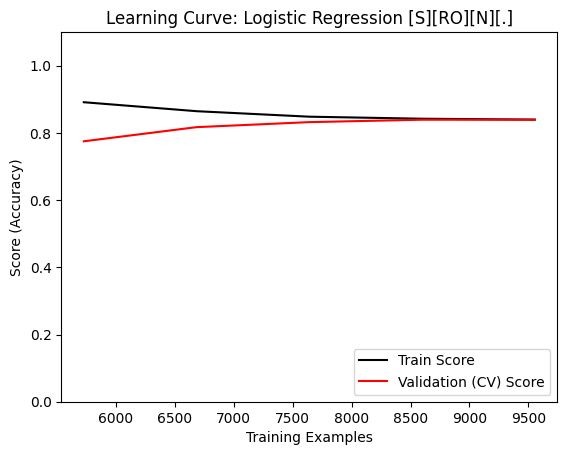

Model Name           Logistic Regression [S][RO][N][.]
Accuracy (Train)                              0.840144
Accuracy (Dev)                                0.833169
Precision (Train)                               0.8385
Precision (Dev)                                0.51049
Recall (Train)                                0.842572
Recall (Dev)                                  0.834286
Name: 2, dtype: object


In [51]:
## Use sklearn to run LR model - apply Random Oversampling with Normalization

# Normalize the training and validation (dev) sets (scaling = zero mean and unit variance)
scaler = StandardScaler()
X_train_rsos_scaled = scaler.fit_transform(X_train_rsos)
X_dev_scaled = scaler.transform(X_dev_f1)

# Fit the model on training set
LR = LogisticRegression(random_state = 42)
LR.fit(X_train_rsos_scaled, y_train_rsos)

# Evaluate model performance metrics on training and validation (dev) sets
eval_metrics_model("Logistic Regression [S][RO][N][.]",
                   LR, X_train_rsos_scaled, y_train_rsos, X_dev_scaled, y_dev)

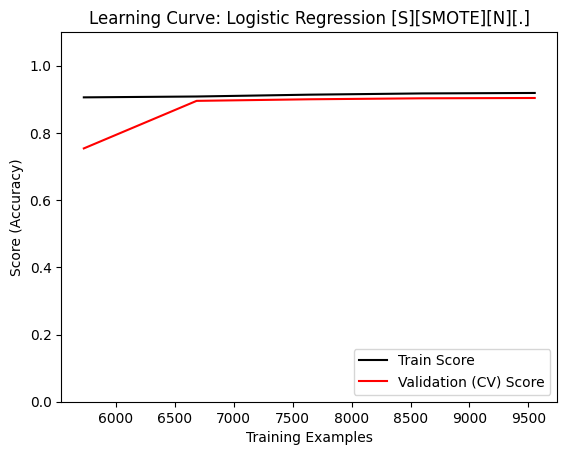

Model Name           Logistic Regression [S][SMOTE][N][.]
Accuracy (Train)                                 0.917769
Accuracy (Dev)                                   0.897335
Precision (Train)                                0.931799
Precision (Dev)                                  0.702857
Recall (Train)                                   0.901524
Recall (Dev)                                     0.702857
Name: 3, dtype: object


In [52]:
## Use sklearn to run LR model - apply SMOTE with Normalization

# Normalize the training and validation (dev) sets (scaling = zero mean and unit variance)
scaler = StandardScaler()
X_train_rssm_scaled = scaler.fit_transform(X_train_rssm)
X_dev_scaled = scaler.transform(X_dev_f1)

# Fit the model on training set
LR.fit(X_train_rssm_scaled,y_train_rssm)

# Evaluate model performance metrics on training and validation (dev) sets
eval_metrics_model("Logistic Regression [S][SMOTE][N][.]",
                   LR, X_train_rssm_scaled, y_train_rssm, X_dev_scaled, y_dev)

##### Observations:
- We trained two LR models using sklearn to compare resampling methods (Random Oversampling and SMOTE). Both models involve standard scaling/normalization on training data.
- The **Logistic Regression - sklearn - SMOTE & Normalization** model appears to perform better than the **Logistic Regression - sklearn - Random Oversampling & Normalization** model. This result suggests that SMOTE may be a better technique than Random Oversampling for correcting imbalanced data, though we intend to repeat a similar test with additional models to corroborate these findings.

#### `Tensorflow Logistic Regression (Deep Learning/NN)`

In [53]:
## Use Tensorflow to run LR model - apply SMOTE with Normalization

# Create a function to plot model loss at each epoch and display final loss results
def show_history(model_name, history):
    """Used with Tensorflow models. Plots the loss at each epoch, stores final evaluation metrics
    in `df_results`, and prints final evaluation metrics.
    
    Arguments:
    ----------
    model_name: Model name to be given
    history: Model history to be used

    Returns:
    --------
    Stores evalution metrics (Accuracy, Precision, and Recall) for training and validation (dev) sets
    Prints evaluation metrics for the specific model and plots loss history
    """
    # Establish global dataframe object to store model results
    global df_results

    # Create loss history plot
    plt.figure()
    plt.title("Loss Curve: " + model_name)
    plt.plot(history.history["loss"], color = "black", label = "Train Loss")
    plt.plot(history.history["val_loss"], color = "red", label = "Validation Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()
    
    # Identify Accuracy, Precision, and Recall results for training set
    train_accuracy = history.history["accuracy"][-1]
    train_precision = history.history["precision"][-1]
    train_recall = history.history["recall"][-1]

    # Identify Accuracy, Precision, and Recall results for validation (dev) set
    dev_accuracy = history.history["val_accuracy"][-1]
    dev_precision = history.history["val_precision"][-1]
    dev_recall = history.history["val_recall"][-1]

    # Store model results in global dataframe and print dataframe
    new_model = {
        "Model Name": model_name,
        "Accuracy (Train)": train_accuracy, "Accuracy (Dev)": dev_accuracy,
        "Precision (Train)": train_precision, "Precision (Dev)": dev_precision,
        "Recall (Train)": train_recall, "Recall (Dev)": dev_recall
    }
    df_results = pd.concat([df_results, pd.DataFrame(new_model, index = [0])], ignore_index = True)
    print(df_results.iloc[-1, :])

In [54]:
## Use Tensorflow to run LR model - apply SMOTE with Normalization

# Build Keras Sequential model to perform LR with Normalization layer
def build_model_sequential_norm(num_features, mean, std):
    """Used with Tensorflow models. Compiles a deep learning model (neural network) with a Normalization
    layer and a Dense/Hidden layer. 

    Arguments:
    ----------
    num_features: Number of features included in model
    mean: Mean of the dataset used for modeling
    std: Standard deviation of the dataset used for modeling
    
    Returns:
    --------
    model: Instantiated deep-learning/neural network model
    """
    # Clear session and remove randomness
    tf.keras.backend.clear_session()
    tf.random.set_seed(0)
    
    # Add Normalization layer for data preprocessing
    normalization_layer = tf.keras.layers.experimental.preprocessing.Normalization(
        mean = mean,
        variance = std ** 2
    )

    # Define model and add Input layer with data features, Normalization layer, and Hidden layer to model
    model = tf.keras.Sequential(name = "Credit_Card_Churn")
    model.add(tf.keras.layers.InputLayer(input_shape = (num_features, )))
    model.add(normalization_layer)
    model.add(tf.keras.layers.Dense(
        units = 1,                       # Simple build for binary classification task
        activation = "sigmoid",          # Activation function aligns with Logistic Regression
        name = "Attrited")
    )
    precision = Precision()
    recall = Recall()

    # Compile model with additional parameters and store Accuracy, Precision, and Recall performance metrics
    # Note: If using Colab CPU - need to modify optimizer code for Adam as below:
    # optimizer = tf.keras.optimizers.legacy.Adam(learning_rate = 0.001)
    model.compile(
        optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001),
        loss = "binary_crossentropy",
        metrics = ["accuracy", precision, recall]
    )
    
    return model

Metal device set to: Apple M2 Pro
Model: "Credit_Card_Churn"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 14)               0         
 n)                                                              
                                                                 
 Attrited (Dense)            (None, 1)                 15        
                                                                 
Total params: 15
Trainable params: 15
Non-trainable params: 0
_________________________________________________________________


2023-04-04 21:48:11.677193: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-04 21:48:11.677313: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2023-04-04 21:48:11.918745: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-04-04 21:48:12.141351: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-04-04 21:48:14.472237: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


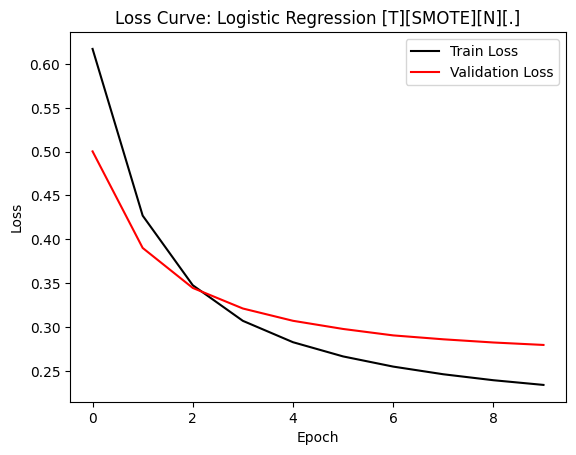

Model Name           Logistic Regression [T][SMOTE][N][.]
Accuracy (Train)                                 0.912494
Accuracy (Dev)                                   0.903258
Precision (Train)                                0.929993
Precision (Dev)                                  0.727811
Recall (Train)                                   0.892145
Recall (Dev)                                     0.702857
Name: 4, dtype: object


In [55]:
## Use Tensorflow to run LR model - apply SMOTE with Normalization

# Calculate mean and variance on training set prior to applying Normalization
mean_rssm = np.mean(X_train_rssm, axis = 0)
std_rssm = np.std(X_train_rssm, axis = 0)

# Build model and show trainable parameters
model_lrsm = build_model_sequential_norm(len(X_train_rssm.columns), mean_rssm, std_rssm)
model_lrsm.summary()

# Fit the model on training set and get model loss history and performance metrics
history = model_lrsm.fit(
    x = X_train_rssm,
    y = y_train_rssm,
    epochs = 10,
    batch_size = 32,
    validation_data = (X_dev_f1, y_dev),
    verbose = 0
)

# Evaluate model performance metrics on training and validation (dev) sets
show_history("Logistic Regression [T][SMOTE][N][.]", history)

Model: "Credit_Card_Churn"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 14)               0         
 n)                                                              
                                                                 
 Attrited (Dense)            (None, 1)                 15        
                                                                 
Total params: 15
Trainable params: 15
Non-trainable params: 0
_________________________________________________________________


2023-04-04 21:48:34.935688: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-04-04 21:48:36.469355: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


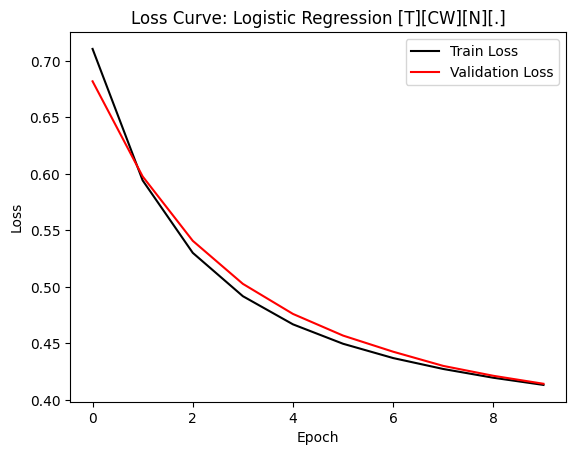

Model Name           Logistic Regression [T][CW][N][.]
Accuracy (Train)                              0.814334
Accuracy (Dev)                                0.812438
Precision (Train)                             0.451629
Precision (Dev)                               0.475248
Recall (Train)                                0.831692
Recall (Dev)                                  0.822857
Name: 5, dtype: object


In [56]:
## Use Tensorflow to run LR model - apply Class Weights (rebalancing technique) with Normalization

# Reproduce the class weights calculated by 'balanced' in sklearn - for separate tuning
weight_for_0 = (1 / len(y_train[y_train == 0])) * (len(y_train) / 2)
weight_for_1 = (1 / len(y_train[y_train == 1])) * (len(y_train) / 2)
class_weights = {0: weight_for_0, 1: weight_for_1}   

# Calculate mean and variance on training set prior to applying Normalization
mean_cw = np.mean(X_train_f1, axis = 0)
std_cw = np.std(X_train_f1, axis = 0)

# Build model and show trainable parameters
model_lrcw = build_model_sequential_norm(len(X_train_f1.columns), mean_cw, std_cw)
model_lrcw.summary()

# Fit the model on training set and get model loss history and performance metrics
history = model_lrcw.fit(
    x = X_train_f1,
    y = y_train,
    epochs = 10,
    batch_size = 32,
    validation_data = (X_dev_f1, y_dev),
    verbose = 0,
    class_weight = class_weights
)

# Evaluate model performance metrics on training and validation (dev) sets
show_history("Logistic Regression [T][CW][N][.]", history)

##### Observations:
- We trained two additional LR models using Tensorflow to examine deep learning/neural network performance. Both models involve standard scaling/normalization on training data, and the second model applies another data rebalancing technique using class weights.
- The **Logistic Regression - Tensorflow - SMOTE & Normalization** model appears to perform better than the **Logistic Regression - Tensorflow - Class Weights & Normalization** model. More specifically, model Accuracy appears to be higher –– and Precision and Recall scores also appear to be more balanced –– under SMOTE than under Class Weights. This result corroborates our earlier conclusion around SMOTE being a superior resampling/rebalancing technique for this dataset.

### `[3.E] Train Support Vector Machine (SVM) Model`

Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.
Liblinear failed to converge, increase the number of iterations.


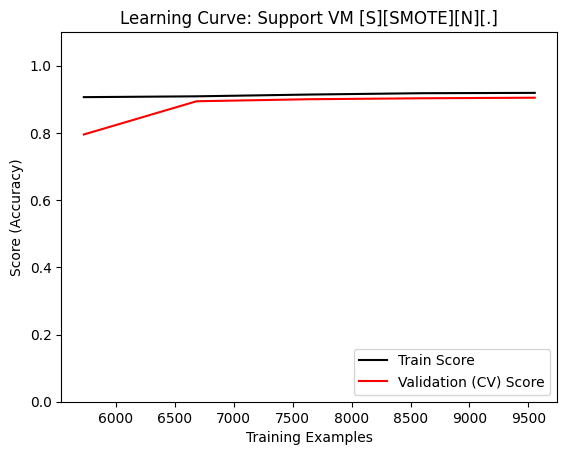

Model Name           Support VM [S][SMOTE][N][.]
Accuracy (Train)                        0.917937
Accuracy (Dev)                          0.900296
Precision (Train)                       0.931822
Precision (Dev)                         0.712644
Recall (Train)                          0.901859
Recall (Dev)                            0.708571
Name: 6, dtype: object


In [57]:
## Use sklearn to run SVM model - apply SMOTE with Normalization

# Fit the model on training set
SVM = LinearSVC(max_iter = 5000)
SVM.fit(X_train_rssm_scaled, y_train_rssm)

# Evaluate model performance metrics on training and validation (dev) sets
eval_metrics_model("Support VM [S][SMOTE][N][.]",
                   SVM, X_train_rssm_scaled, y_train_rssm, X_dev_scaled, y_dev)

### `[3.F] Train Naive Bayes (NB) Model`

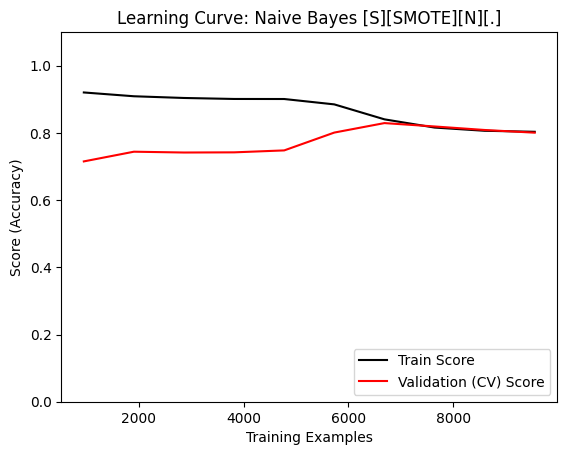

Model Name           Naive Bayes [S][SMOTE][N][.]
Accuracy (Train)                         0.803969
Accuracy (Dev)                           0.764067
Precision (Train)                        0.777269
Precision (Dev)                          0.396104
Recall (Train)                           0.852119
Recall (Dev)                             0.697143
Name: 7, dtype: object


In [58]:
## Use sklearn to run NB model - apply SMOTE with Normalization

# Fit the model on training set
GNB = GaussianNB()
GNB.fit(X_train_rssm_scaled, y_train_rssm)

# Evaluate model performance metrics on training and validation (dev) sets
eval_metrics_model("Naive Bayes [S][SMOTE][N][.]",
                   GNB, X_train_rssm_scaled, y_train_rssm, X_dev_scaled, y_dev)

### `[3.G] Train K-Nearest Neighbors Classification (KNN-C) Model`

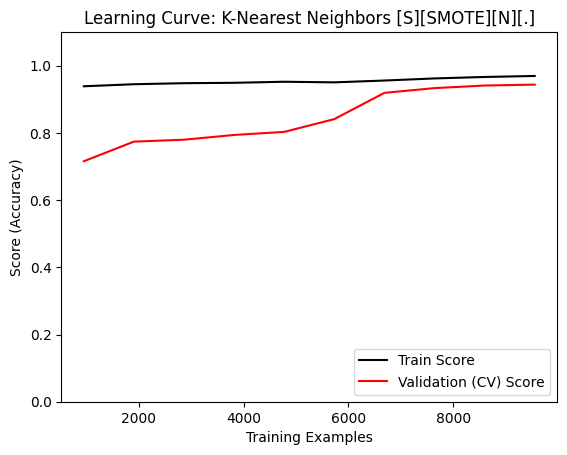

Model Name           K-Nearest Neighbors [S][SMOTE][N][.]
Accuracy (Train)                                 0.970775
Accuracy (Dev)                                   0.914116
Precision (Train)                                0.972278
Precision (Dev)                                     0.775
Recall (Train)                                   0.969184
Recall (Dev)                                     0.708571
Name: 8, dtype: object


In [59]:
## Use sklearn to run KNN-C model - apply SMOTE with Normalization

# Fit the model on training set
KNN = KNeighborsClassifier()
KNN.fit(X_train_rssm_scaled, y_train_rssm)

# Evaluate model performance metrics on training and validation (dev) sets
eval_metrics_model("K-Nearest Neighbors [S][SMOTE][N][.]",
                   KNN, X_train_rssm_scaled, y_train_rssm, X_dev_scaled, y_dev)

### `[3.H] Train Random Forest Ensemble Classification (RF-C) Model`

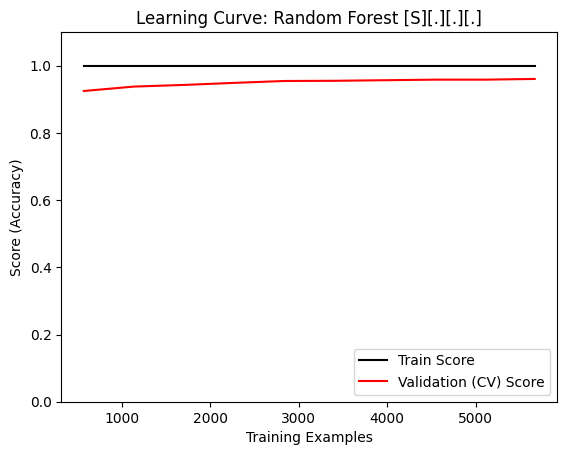

Model Name           Random Forest [S][.][.][.]
Accuracy (Train)                            1.0
Accuracy (Dev)                         0.962488
Precision (Train)                           1.0
Precision (Dev)                        0.965986
Recall (Train)                              1.0
Recall (Dev)                           0.811429
Name: 9, dtype: object


In [60]:
## Use sklearn to run RF-C model - with imbalanced dataset and no Normalization

# Fit the model on training set
RF = RandomForestClassifier(random_state = 42)
RF.fit(X_train_f1, y_train)

# Evaluate model performance metrics on training and validation (dev) sets
eval_metrics_model("Random Forest [S][.][.][.]",
                  RF, X_train_f1, y_train, X_dev_f1, y_dev)

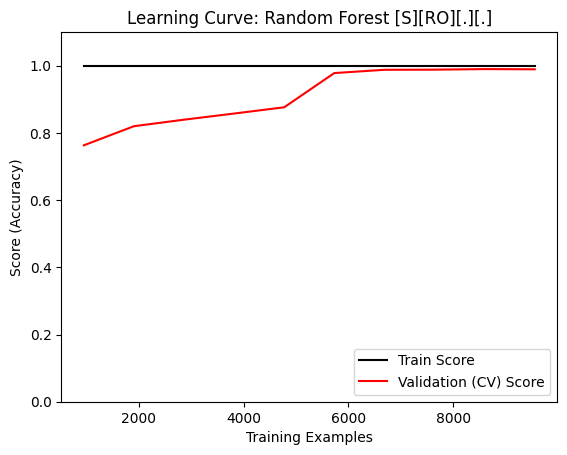

Model Name           Random Forest [S][RO][.][.]
Accuracy (Train)                             1.0
Accuracy (Dev)                          0.964462
Precision (Train)                            1.0
Precision (Dev)                          0.92638
Recall (Train)                               1.0
Recall (Dev)                            0.862857
Name: 10, dtype: object


In [61]:
## Use sklearn to run RF-C model - apply Random Oversampling and no Normalization

# Fit the model on training set
RF.fit(X_train_rsos, y_train_rsos)

# Evaluate model performance metrics on training and validation (dev) sets
eval_metrics_model("Random Forest [S][RO][.][.]",
                   RF, X_train_rsos, y_train_rsos, X_dev_f1, y_dev)

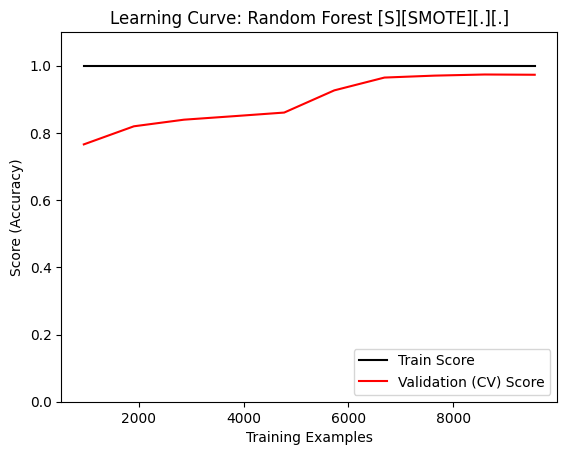

Model Name           Random Forest [S][SMOTE][.][.]
Accuracy (Train)                                1.0
Accuracy (Dev)                             0.964462
Precision (Train)                               1.0
Precision (Dev)                            0.911243
Recall (Train)                                  1.0
Recall (Dev)                                   0.88
Name: 11, dtype: object


In [62]:
## Use sklearn to run RF-C model - apply SMOTE and no Normalization

# Fit the model on training set
RF.fit(X_train_rssm, y_train_rssm)

# Evaluate model performance metrics on training and validation (dev) sets
eval_metrics_model("Random Forest [S][SMOTE][.][.]",
                   RF, X_train_rssm, y_train_rssm, X_dev_f1, y_dev)

In [63]:
##################################################################################################################
## CODE WAS RUN ONCE TO GENERATE FIGURE FOR DOWNLOAD AND THEN COMMENTED OUT TO PREVENT RE-RUNS
##################################################################################################################

# # Visualizing a decision tree within RF-C model - apply SMOTE and no Normalization

# # Extract single tree (6th) from RF-C model
# estimator = RF.estimators_[5]

# # Export tree graphic as dot file
# export_graphviz(estimator,
#                 out_file = "tree.dot", 
#                 feature_names = X_train_f1.columns,
#                 class_names = class_targets,
#                 rounded = True,
#                 proportion = False, 
#                 precision = 2,
#                 filled = True)

# # Convert dot file to png using system command
# call(["dot", "-Tpng", "tree.dot", "-o", "tree.png", "-Gdpi=1200"])

# # Display graphic
# Image(filename = "tree.png")

##### Observations:
- We trained several additional classification models using sklearn to examine alternative approaches to logistic regression. Some of these models (Support Vector Machine, Naive Bayes, and K-Nearest Neighbors) involve standard scaling/normalization on the training data, while others (Random Forest ensemble method) do not.
- The **Random Forest - sklearn - SMOTE** model appears to have the best performance metrics across these different model types –– though we did notice a perfect (100%) Accuracy score, which encouraged us to dive deeper and look for ways to avoid overfitting. It's possible that the depth of the decision tree classifier is so large that only a single data point is present at each leaf.
- As a next step, we will focus on tuning the hyperparameters of the **Random Forest - sklearn - SMOTE** model to achieve a more generalizable outcome. In our hyperparameter tuning, we will try to emphasize Recall over Precision, as previously discussed.

In [64]:
## Use sklearn to run RF-C model - apply SMOTE and no Normalization - tune hyperparameters with GridSearchCV

# Create random forest classifier object
RF = RandomForestClassifier(random_state = 42)

# Capture list of default parameters
RF.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}

Best Parameters: {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 50}


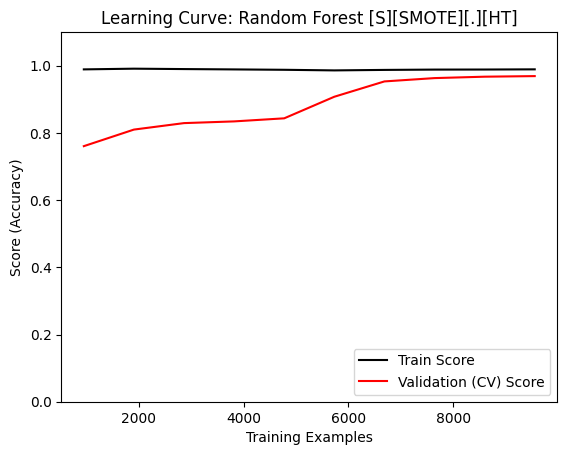

Model Name           Random Forest [S][SMOTE][.][HT]
Accuracy (Train)                            0.987858
Accuracy (Dev)                               0.95459
Precision (Train)                           0.983085
Precision (Dev)                             0.860335
Recall (Train)                              0.992799
Recall (Dev)                                    0.88
Name: 12, dtype: object


In [65]:
## Use sklearn to run RF-C model - apply SMOTE and no Normalization - tune hyperparameters with GridSearchCV

# Define the parameter grid to search over
RF_param_grid = {
    "max_depth": [5, 10, None],
    "min_samples_leaf": [1, 2, 4],
    "min_samples_split": [2, 5, 10],
    "n_estimators": [50, 100, 200]
}

# Create GridSearchCV object (optimizing Recall to minimize False Negatives)
RF_grid_search = GridSearchCV(
    estimator = RF,
    param_grid = RF_param_grid,
    cv = 5,
    scoring = "recall"
)

# Fit GridSearchCV object to training set
RF_grid_search.fit(X_train_rssm, y_train_rssm)

# Print the best parameters found by the gridsearch
print("Best Parameters:", RF_grid_search.best_params_)

# Evaluate model performance metrics on training and validation (dev) sets with best hyperparameters
RF_best = RF_grid_search.best_estimator_
eval_metrics_model("Random Forest [S][SMOTE][.][HT]",
                   RF_best, X_train_rssm, y_train_rssm, X_dev_f1, y_dev)

In [66]:
# Evaluate model feature importances based on SMOTE
RF_importances = RF_best.feature_importances_
RF_indices = RF_importances.argsort()[::-1]

# Display feature importance ranking
print("Feature ranking:")
for f in range(X_train_rssm.shape[1]):
    print("%d. %s (%f)" % (f + 1, X_train_rssm.columns[RF_indices[f]], RF_importances[RF_indices[f]]))

Feature ranking:
1. Total_Trans_Ct (0.256683)
2. Total_Trans_Amt (0.230021)
3. Total_Revolving_Bal (0.120000)
4. Total_Ct_Chng_Q4_Q1 (0.113082)
5. Total_Relationship_Count (0.062394)
6. Total_Amt_Chng_Q4_Q1 (0.048594)
7. Gender_M (0.045199)
8. Marital_Status_Married (0.032545)
9. Gender_F (0.030781)
10. Customer_Age (0.023170)
11. Marital_Status_Single (0.014579)
12. Months_Inactive_12_mon (0.013063)
13. Marital_Status_Divorced (0.005286)
14. Marital_Status_Unknown (0.004604)


In [67]:
# Create a function to generate a feature importance plot
def feature_importance_plot(df, model, title_suffix):
    """Plot feature importances for a given model.

    Arguments:
    ----------
    df: Data used to train or test model
    model: Model to examine

    Returns:
    --------
    Barplot showing relative importances across all features
    """
    # Get lists of features and importances
    features = list(df)
    importances = list(model.feature_importances_)
    
    # Combine lists together
    zipped_fimp = list(zip(features, importances))
    
    # Store features and importances in dataframe, ranked from highest to lowest importance
    df_fimp = pd.DataFrame(zipped_fimp, columns = ["Feature", "Importance"])
    df_fimp = df_fimp.sort_values("Importance", ascending = True)
    
    # Create feature importance plot
    df_fimp[0:np.shape(df)[1]].plot(
        kind = "barh",
        x = "Feature",
        figsize = (9, 5),
        title = "Feature Importance Plot – " + title_suffix
    )
    
    # Display plot
    plt.show()

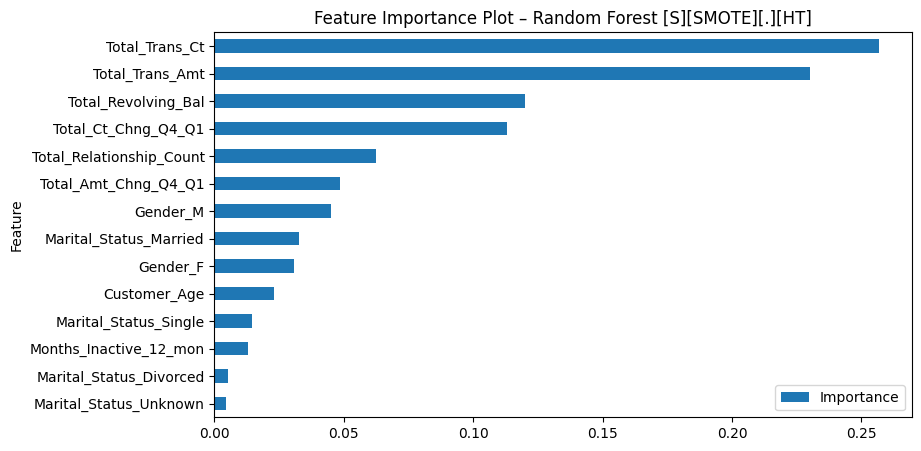

In [68]:
# Generate a feature importance plot
feature_importance_plot(X_train_rssm, RF_best, "Random Forest [S][SMOTE][.][HT]")

##### Observations:
- We used GridSearchCV to evaluate and tune the hyperparameters of the **Random Forest - sklearn - SMOTE** model to optimize Recall.
- GridSearchCV indicates that the model performs best with the following parameters:
    - max_depth: [5, **10**, None] -> **10** maximum depth of tree
    - min_samples_leaf: [1, **2**, 4] -> **2** minimum data samples required in leaf node
    - min_samples_split: [2, **5**, 10] -> **5** minimum data samples required to split internal node
    - n_estimators: [**50**, 100, 200] -> **50** trees in the forest
    - default values for all others, which were left unadjusted (e.g., bootstrap = True, class_weight = None, max_features = 'sqrt', etc.) 
- We also added a feature importance plot to visualize the amount of influence each model feature exerts on the model's final outcomes/predictions. This plot suggests that credit card usage measures like **`Total_Trans_Ct`**, **`Total_Trans_Amt`**, and **`Total_Revolving_Bal`** are the most important within the model. These results make sense in light our earlier EDA conclusions (**`Part 2`**) and general "domain knowledge" about banking/finance.

### `[3.I] Train XGBoost Gradient Boosting Classification (XGB-C) Model`

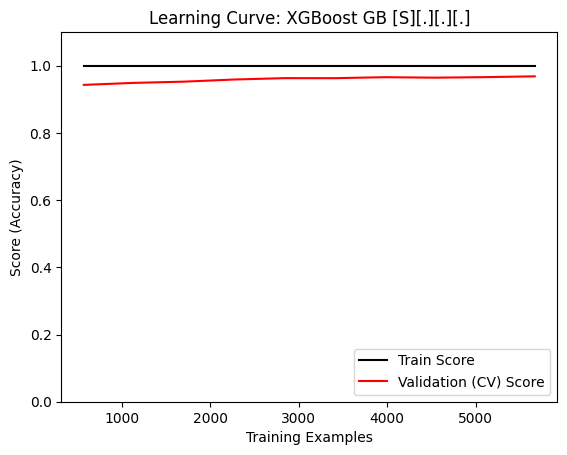

Model Name           XGBoost GB [S][.][.][.]
Accuracy (Train)                         1.0
Accuracy (Dev)                      0.968411
Precision (Train)                        1.0
Precision (Dev)                      0.93865
Recall (Train)                           1.0
Recall (Dev)                        0.874286
Name: 13, dtype: object


In [69]:
## Use sklearn to run XGB-C model - with imbalanced dataset and no Normalization

# Fit the model on training set
XGB = xgb.XGBClassifier(booster = "gbtree", random_state = 42)
XGB.fit(X_train_f1, y_train)

# Evaluate model performance metrics on training and validation (dev) sets
eval_metrics_model("XGBoost GB [S][.][.][.]",
                   XGB, X_train_f1, y_train, X_dev_f1, y_dev)

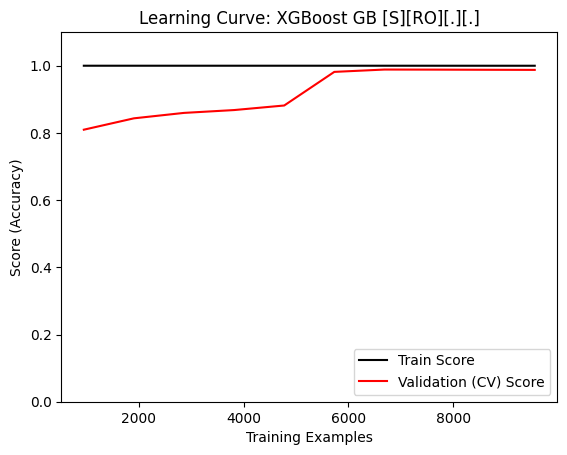

Model Name           XGBoost GB [S][RO][.][.]
Accuracy (Train)                     0.999916
Accuracy (Dev)                       0.969398
Precision (Train)                    0.999833
Precision (Dev)                      0.913793
Recall (Train)                            1.0
Recall (Dev)                         0.908571
Name: 14, dtype: object


In [70]:
## Use sklearn to run XGB-C model - apply Random Oversampling and no Normalization

# Fit the model on training set
XGB.fit(X_train_rsos, y_train_rsos)

# Evaluate model performance metrics on training and validation (dev) sets
eval_metrics_model("XGBoost GB [S][RO][.][.]",
                   XGB, X_train_rsos, y_train_rsos, X_dev_f1, y_dev)

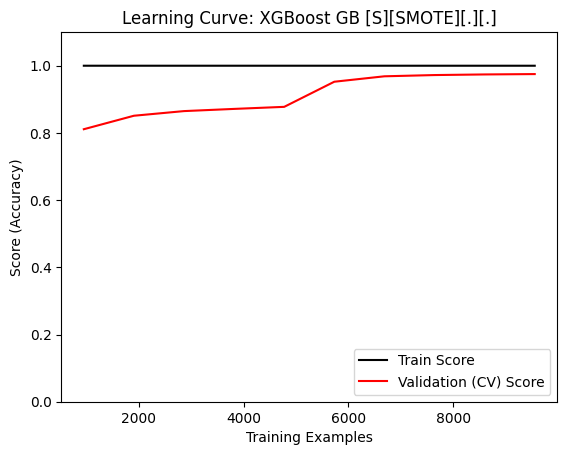

Model Name           XGBoost GB [S][SMOTE][.][.]
Accuracy (Train)                        0.999916
Accuracy (Dev)                          0.969398
Precision (Train)                       0.999833
Precision (Dev)                         0.913793
Recall (Train)                               1.0
Recall (Dev)                            0.908571
Name: 15, dtype: object


In [71]:
## Use sklearn to run XGB-C model - apply SMOTE and no Normalization

# Fit the model on training set
XGB.fit(X_train_rssm, y_train_rssm)

# Evaluate model performance metrics on training and validation (dev) sets
eval_metrics_model("XGBoost GB [S][SMOTE][.][.]",
                   XGB, X_train_rssm, y_train_rssm, X_dev_f1, y_dev)

In [72]:
## Use sklearn to run XGB-C model - apply SMOTE and no Normalization - tune hyperparameters with GridSearchCV

# Create gradient boosting classifier object
XGB = xgb.XGBClassifier(booster = "gbtree", random_state = 42)

# Capture list of default parameters
XGB.get_params()

{'objective': 'binary:logistic',
 'use_label_encoder': None,
 'base_score': None,
 'booster': 'gbtree',
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': None,
 'gpu_id': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'n_estimators': 100,
 'n_jobs': None,
 'num_parallel_tree': None,
 'predictor': None,
 'random_state': 42,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

Best Parameters: {'gamma': 2, 'learning_rate': 0.1, 'max_depth': 10, 'min_child_weight': 2, 'n_estimators': 50}


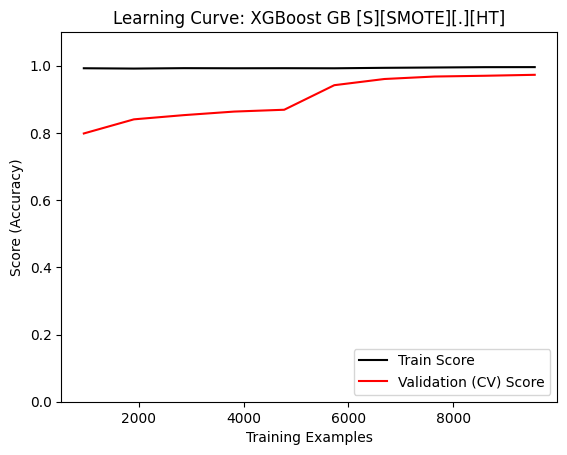

Model Name           XGBoost GB [S][SMOTE][.][HT]
Accuracy (Train)                         0.996064
Accuracy (Dev)                           0.966436
Precision (Train)                        0.994326
Precision (Dev)                          0.889503
Recall (Train)                           0.997823
Recall (Dev)                                 0.92
Name: 16, dtype: object


In [73]:
## Use sklearn to run XGB-C model - apply SMOTE and no Normalization - tune hyperparameters with GridSearchCV

# Define the parameter grid to search over
XGB_param_grid = {
    "gamma": [0.5, 1, 2],
    "learning_rate": [0.01, 0.1],
    "max_depth": [5, 10, None],
    "min_child_weight": [1, 2, 4],
    "n_estimators": [50, 100, 200]
}

# Create GridSearchCV object (optimizing Recall to minimize False Negatives)
XGB_grid_search = GridSearchCV(
    estimator = XGB,
    param_grid = XGB_param_grid,
    cv = 5,
    scoring = "recall"
)

# Fit GridSearchCV object to training set
XGB_grid_search.fit(X_train_rssm, y_train_rssm)

# Print the best parameters found by the gridsearch
print("Best Parameters:", XGB_grid_search.best_params_)

# Evaluate model performance metrics on training and validation (dev) sets with best hyperparameters
XGB_best = XGB_grid_search.best_estimator_
eval_metrics_model("XGBoost GB [S][SMOTE][.][HT]",
                   XGB_best, X_train_rssm, y_train_rssm, X_dev_f1, y_dev)

In [74]:
# Evaluate model feature importances based on SMOTE
XGB_importances = XGB_best.feature_importances_
XGB_indices = XGB_importances.argsort()[::-1]

# Display feature importance ranking
print("Feature ranking:")
for f in range(X_train_rssm.shape[1]):
    print("%d. %s (%f)" % (f + 1, X_train_rssm.columns[XGB_indices[f]], XGB_importances[XGB_indices[f]]))

Feature ranking:
1. Total_Trans_Ct (0.326270)
2. Total_Relationship_Count (0.090200)
3. Marital_Status_Married (0.080671)
4. Gender_M (0.071020)
5. Total_Revolving_Bal (0.069334)
6. Total_Trans_Amt (0.059904)
7. Total_Ct_Chng_Q4_Q1 (0.056587)
8. Gender_F (0.055615)
9. Marital_Status_Divorced (0.051780)
10. Marital_Status_Unknown (0.041154)
11. Marital_Status_Single (0.029275)
12. Total_Amt_Chng_Q4_Q1 (0.027955)
13. Customer_Age (0.025068)
14. Months_Inactive_12_mon (0.015166)


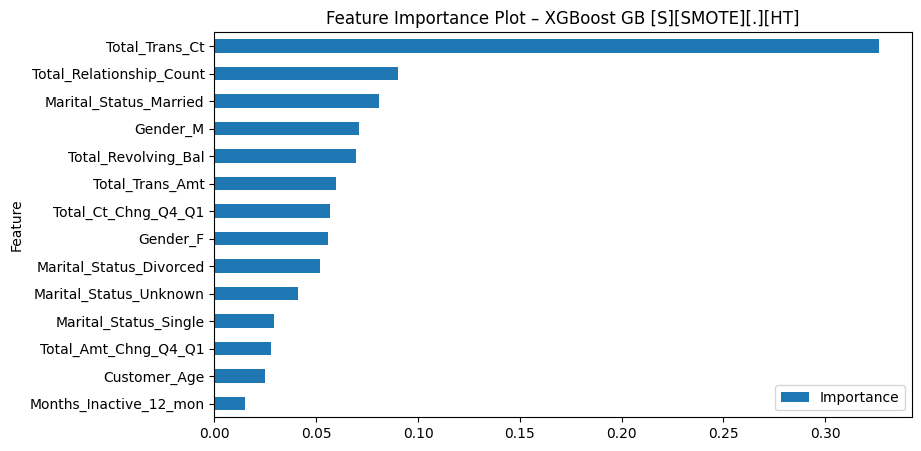

In [75]:
# Generate a feature importance plot
feature_importance_plot(X_train_rssm, XGB_best, "XGBoost GB [S][SMOTE][.][HT]")

##### Observations:
- We used GridSearchCV to evaluate and tune the hyperparameters of the **XGBoost - sklearn - SMOTE** model to optimize Recall.
- GridSearchCV indicates that the model performs best with the following parameters:
    - gamma: [0.5, 1, **2**] -> **2** minimum loss reduction required to make partition on a leaf node of tree
    - learning_rate: [0.01, **0.1**] -> **0.1** step size shrinkage used to prevent overfitting
    - max_depth: [5, **10**, None] -> **10** maximum depth of tree
    - min_child_weight: [1, **2**, 4] -> **2** minimum sum of instance weight (hessian) needed in child
    - n_estimators: [**50**, 100, 200] -> **50** trees in the forest
    - default values for all others, which were left unadjusted (e.g., early_stopping_rounds = None, objective = 'binary:logistic', max_leaves: None, etc.) 
- We also added a feature importance plot to visualize the amount of influence each model feature exerts on the model's final outcomes/predictions. This plot suggests that the most important credit card usage measure –– by far and away –– is **`Total_Trans_Ct`**, with other important features including **`Total_Relationship_Count`**, **`Marital_Status_Married`**, and **`Gender_M`**. These results differ to some degree from the tuned **Random Forest - sklearn - SMOTE** model we trained earlier, but are consistent with respect to **`Total_Trans_Ct`**, which further corroborates our earlier EDA conclusions (**`Part 2`**) and makes sense in light of general "domain knowledge" about banking/finance.

### `[3.J] Train AdaBoost Gradient Boosting Classification (AB-C) Model`

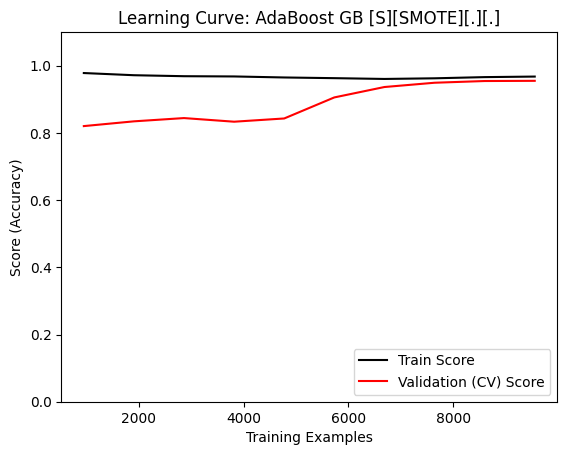

Model Name           AdaBoost GB [S][SMOTE][.][.]
Accuracy (Train)                         0.966337
Accuracy (Dev)                           0.955577
Precision (Train)                        0.962311
Precision (Dev)                          0.877907
Recall (Train)                           0.970692
Recall (Dev)                             0.862857
Name: 17, dtype: object


In [76]:
## Use sklearn to run AB-C model - apply SMOTE and no Normalization

# Fit the model on training set
ABC = AdaBoostClassifier(random_state = 42)
ABC.fit(X_train_rssm, y_train_rssm)

# Evaluate model performance metrics on training and validation (dev) sets
eval_metrics_model("AdaBoost GB [S][SMOTE][.][.]",
                   ABC, X_train_rssm, y_train_rssm, X_dev_f1, y_dev)

##### Observations:
- Training the **AdaBoost - sklearn - SMOTE** model was primarily exploratory to determine if a different boosting algorithm might outperform XGBoost.
- Based on the training results, we can conclude that the **XGBoost - sklearn - SMOTE** model is superior to the **AdaBoost - sklearn - SMOTE** model across every performance metric.

### `[3.K] Train Deep Learning/Neural Network Classification (TF-NN) Models`

#### `Tensorflow - Feed Forward NN`

In [77]:
## Use Tensorflow to run Feed Forward Neural Network model - with Normalization

# Build Keras Sequential model to run FF-NN with sigmoid activation and Normalization layer
def build_model_sequential(num_features, mean, std, hidden_layer_sizes = []):
    """Used with Tensorflow models. Compiles a deep learning model (neural network) with a Normalization
    layer and a Dense/Hidden layer. 

    Arguments:
    ----------
    num_features: Number of features included in model
    mean: Mean of the dataset used for modeling
    std: Standard deviation of the dataset used for modeling
    hidden_layer_sizes: Number of neurons in hidden layers
    
    Returns:
    --------
    model: Instantiated deep-learning/neural network model
    """
    # Clear session and remove randomness
    tf.keras.backend.clear_session()
    tf.random.set_seed(0)
    
    # Add Normalization layer for data preprocessing
    normalization_layer = tf.keras.layers.experimental.preprocessing.Normalization(
        mean = mean,
        variance = std ** 2
    )

    # Define model and add Input layer with data features, Normalization layer, and Hidden layers to model
    model = tf.keras.Sequential(name = "Credit_Card_Churn")
    model.add(tf.keras.layers.InputLayer(input_shape = (num_features, )))
    model.add(normalization_layer)
    for u in hidden_layer_sizes:
        model.add(keras.layers.Dense(
            units = u,                       # Complex build with multiple hidden layers
            activation = "relu")             # Activation function allows for faster learning
    )
    model.add(tf.keras.layers.Dense(
        units = 1,                           # Simple build for binary classification task
        activation = "sigmoid",              # Activation function aligns with Logistic Regression
        name = "Attrited")
    )
    precision = Precision()
    recall = Recall()
  
    # Compile model with additional parameters and store Accuracy, Precision, and Recall performance metrics
    model.compile(
      optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001),
      loss = "binary_crossentropy",
      metrics = ["accuracy", precision, recall]
    )
  
    return model

Model: "Credit_Card_Churn"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 14)               0         
 n)                                                              
                                                                 
 dense (Dense)               (None, 32)                480       
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 dense_2 (Dense)             (None, 8)                 136       
                                                                 
 Attrited (Dense)            (None, 1)                 9         
                                                                 
Total params: 1,153
Trainable params: 1,153
Non-trainable params: 0
_______________________________________________

2023-04-04 22:00:22.631428: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-04-04 22:00:24.552622: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


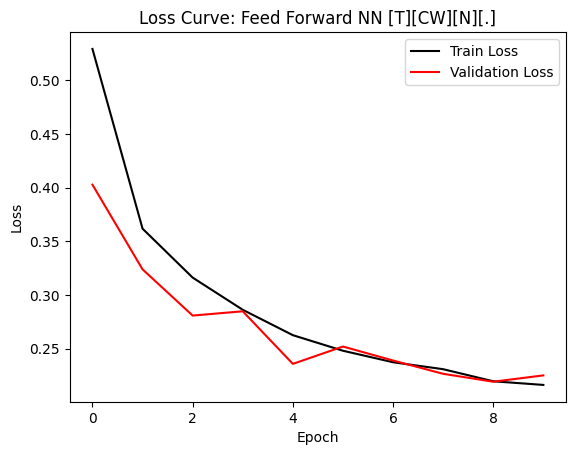

Model Name           Feed Forward NN [T][CW][N][.]
Accuracy (Train)                          0.905615
Accuracy (Dev)                            0.894373
Precision (Train)                         0.637423
Precision (Dev)                           0.633858
Recall (Train)                             0.93017
Recall (Dev)                                  0.92
Name: 18, dtype: object


In [78]:
## Use Tensorflow to run Feed Forward Neural Network model - apply Class Weights with Normalization

# Build model and show trainable parameters
model_ffnn_cw = build_model_sequential(
    len(X_train_f1.columns), mean_cw, std_cw, hidden_layer_sizes = [32, 16, 8]
)
model_ffnn_cw.summary()

# Fit the model on training set and get model loss history and performance metrics
history = model_ffnn_cw.fit(
    x = X_train_f1,
    y = y_train,
    epochs = 10,
    batch_size = 32,
    validation_data = (X_dev_f1, y_dev),
    verbose = 0,
    class_weight = class_weights
)

# Evaluate model performance metrics on training and validation (dev) sets
show_history("Feed Forward NN [T][CW][N][.]", history)

Model: "Credit_Card_Churn"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 14)               0         
 n)                                                              
                                                                 
 dense (Dense)               (None, 32)                480       
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 dense_2 (Dense)             (None, 8)                 136       
                                                                 
 Attrited (Dense)            (None, 1)                 9         
                                                                 
Total params: 1,153
Trainable params: 1,153
Non-trainable params: 0
_______________________________________________

2023-04-04 22:00:40.036108: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-04-04 22:00:42.974441: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


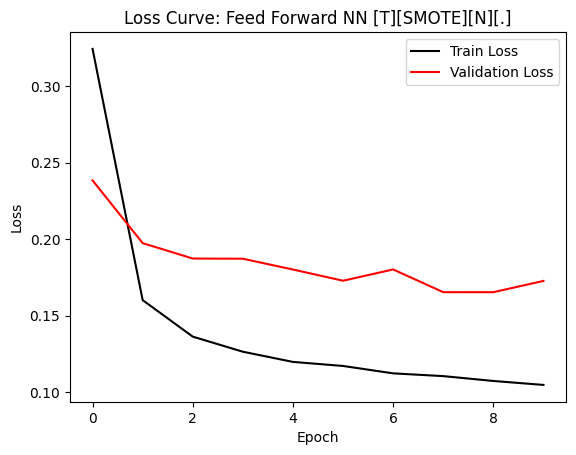

Model Name           Feed Forward NN [T][SMOTE][N][.]
Accuracy (Train)                             0.959722
Accuracy (Dev)                               0.924975
Precision (Train)                            0.962901
Precision (Dev)                              0.767568
Recall (Train)                               0.956289
Recall (Dev)                                 0.811429
Name: 19, dtype: object


In [79]:
## Use Tensorflow to run Feed Forward Neural Network model - apply SMOTE with Normalization

# Build model and show trainable parameters
model_ffnn_rssm = build_model_sequential(
    len(X_train_rssm.columns), mean_rssm, std_rssm, hidden_layer_sizes = [32, 16, 8]
)
model_ffnn_rssm.summary()

# Fit the model on training set and get model loss history and performance metrics
history = model_ffnn_rssm.fit(
    x = X_train_rssm,
    y = y_train_rssm,
    epochs = 10,
    batch_size = 32,
    validation_data = (X_dev_f1, y_dev),
    verbose = 0
)

# Evaluate model performance metrics on training and validation (dev) sets
show_history("Feed Forward NN [T][SMOTE][N][.]", history)

#### `Tensorflow - NN with Embeddings`

In [80]:
## Use Tensorflow to run Neural Network with Embeddings model - with Normalization

# Build Keras Sequential model to run NN with embeddings, sigmoid activation, and Normalization layer
def build_model_embedding(num_categories, num_numeric_features):
    """Used with Tensorflow models. Compiles a deep learning model (neural network) with an Embeddings
    layer, Normalization layer, and a Dense/Hidden layer. 

    Arguments:
    ----------
    num_categories: Number of categories included in model
    num_numeric_features: Number of numeric features included in model
    
    Returns:
    --------
    model: Instantiated deep-learning/neural network model
    """
    # Clear session and remove randomness
    tf.keras.backend.clear_session()
    tf.random.set_seed(0)
    
    # Define Input layers
    input_layers = []
    embedding_layers = []
    
    # Add Embedding layer for categorical features
    for i in range(num_categories):
        input_layer = keras.layers.Input(shape = (1, ), name = "input_" + str(i))
        num_unique_categories = X_train[features_2_categorical].iloc[:, i].max() + 1
        embedding_dim = min(50, num_unique_categories // 2 + 1)
        embedding_layer = keras.layers.Embedding(
            input_dim = num_unique_categories,
            output_dim = embedding_dim,
            name = f"embedding_{i}"
        )(input_layer)
        input_layers.append(input_layer)
        embedding_layers.append(embedding_layer)
    
    # Add Input layer for numeric features, Normalization layer, and Hidden layers to model
    numeric_input_layer = keras.layers.Input(shape = (num_numeric_features, ), name = "numeric_inputs")
    numeric_normalization_layer = keras.layers.BatchNormalization()(numeric_input_layer)
    numeric_dense_layer = keras.layers.Dense(
        units = 32,                       # Complex build with multiple hidden layers
        activation = "relu"               # Activation function allows for faster learning
    )(numeric_input_layer)
  
    # Combine Embedding and Dense layers
    embedding_output_layer = keras.layers.concatenate(embedding_layers)
    flattened_embedding_layer = keras.layers.Flatten()(embedding_output_layer)
    combined_layer = keras.layers.concatenate([flattened_embedding_layer, numeric_dense_layer])
    output_layer = keras.layers.Dense(
        units = 1,                        # Simple build for binary classification task
        activation = "sigmoid",           # Activation function aligns with Logistic Regression
        name = "Attrited"
    )(combined_layer)
    precision = Precision()
    recall = Recall()

    # Define and name model
    model = keras.models.Model(
        inputs = [input_layers, numeric_input_layer],
        outputs = output_layer,
        name = "Credit_Card_Churn"
    )

    # Compile model with additional parameters and store Accuracy, Precision, and Recall performance metrics
    model.compile(
        optimizer = keras.optimizers.Adam(learning_rate = 0.001),
        loss = "binary_crossentropy",
        metrics = ["accuracy", precision, recall]
    )
    
    return model

Model: "Credit_Card_Churn"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_0 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 input_1 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 embedding_0 (Embedding)        (None, 1, 2)         6           ['input_0[0][0]']                
                                                                                                  
 embedding_1 (Embedding)        (None, 1, 3)         12          ['input_1[0][0]']                
                                                                                  

2023-04-04 22:01:07.747230: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-04-04 22:01:10.219520: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


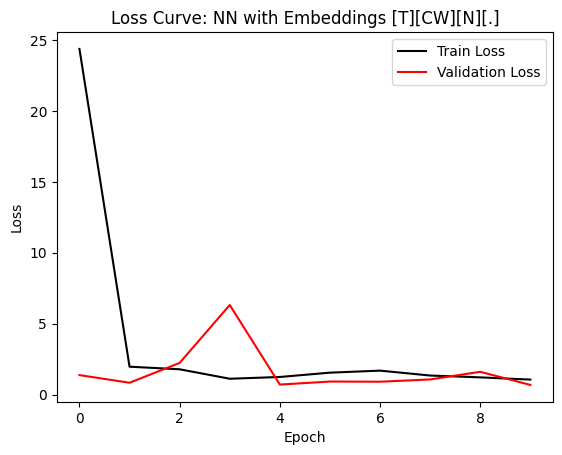

Model Name           NN with Embeddings [T][CW][N][.]
Accuracy (Train)                             0.776242
Accuracy (Dev)                               0.833169
Precision (Train)                            0.391586
Precision (Dev)                              0.514019
Recall (Train)                               0.758281
Recall (Dev)                                 0.628571
Name: 20, dtype: object


In [81]:
## Use Tensorflow to run Neural Network with Embeddings model - apply Class Weights with Normalization

# Define lists of categorical and numeric features
features_2_categorical = ["Gender_RE", "Marital_Status_RE"]

features_2_numerical = ["Customer_Age", "Total_Relationship_Count", "Months_Inactive_12_mon", 
                        "Total_Revolving_Bal", "Total_Trans_Amt", "Total_Amt_Chng_Q4_Q1", 
                        "Total_Trans_Ct", "Total_Ct_Chng_Q4_Q1"]

# Create objects corresponding to categorical and numeric features from training and validation (dev) sets
X_train_f2_cat = [X_train[feature].values for feature in features_2_categorical]
X_train_f2_num = X_train[features_2_numerical].values
X_dev_f2_cat = [X_dev[feature].values for feature in features_2_categorical]
X_dev_f2_num = X_dev[features_2_numerical].values

# Build model and show trainable parameters
model_embed = build_model_embedding(len(features_2_categorical), len(features_2_numerical))
model_embed.summary()

# Fit the model on training set and get model loss history and performance metrics
history = model_embed.fit(
    x = X_train_f2_cat + [X_train_f2_num],
    y = y_train.values,
    epochs = 10,
    batch_size = 32,
    validation_data = (X_dev_f2_cat + [X_dev_f2_num], y_dev.values),
    verbose = 0,
    class_weight = class_weights
)

# Evaluate model performance metrics on training and validation (dev) sets
show_history("NN with Embeddings [T][CW][N][.]", history)

##### Observations:
- The last models we explored involved deep learning and neural networks. The results of our neural network model training suggest that the added complexity of these models doesn't automatically translate to stronger performance.  
- The Recall score (across training and validation sets) for our **Neural Network - Tensorflow - Class Weights & Normalization** model is one of the strongest scores among our models, which means that this model could potentially be ensembled with other models to improve overall performance. However, we should be wary of the potential for overfitting (as the model's loss curve plot shows).
- We believe there could be more opportunity to refine and improve the **Neural Network with Embeddings - Tensorflow - Class Weights & Normalization** model, as this model involves several layers and incorporates embeddings. However, at this time, we have chosen not to proceed with any additional hyperparameter tuning or training given the mediocre performance metrics.

### `[3.L] Train Custom Ensemble Model - Best XGB-C and TF-NN`

In [82]:
## Combine predictions from Best XGB-C and TF-NN as an ensemble model

# Calculate training set prediction probabilities and convert to [0, 1] predictions
ffnn_probs_train = np.reshape(model_ffnn_cw.predict(X_train_f1), (-1, ))
xgb_probs_train = np.reshape(XGB_best.predict_proba(X_train_f1)[:, 1], (-1, ))
ensemble_probs_train = 0.40 * ffnn_probs_train + 0.60 * xgb_probs_train
ensemble_preds_train = (ensemble_probs_train >= 0.50).astype(int) # Use default threshold value of 0.50

# Calculate validation (dev) set prediction probabilities and convert to [0, 1] predictions
ffnn_probs_dev = np.reshape(model_ffnn_cw.predict(X_dev_f1), (-1, ))
xgb_probs_dev = np.reshape(XGB_best.predict_proba(X_dev_f1)[:, 1], (-1, ))
ensemble_probs_dev = 0.40 * ffnn_probs_dev + 0.60 * xgb_probs_dev
ensemble_preds_dev = (ensemble_probs_dev >= 0.50).astype(int) # Use default threshold value of 0.50

# Evaluate model performance metrics on training and validation (dev) sets
em_train_accuracy, em_train_precision, em_train_recall = calculate_metrics(ensemble_preds_train, y_train)
em_dev_accuracy, em_dev_precision, em_dev_recall = calculate_metrics(ensemble_preds_dev, y_dev)
add_em = {
    "Model Name": "Ensemble Model - Best XGB-C and TF-NN [S|T][SMOTE|CW][.|N][HT|.]",
    "Accuracy (Train)": em_train_accuracy, "Accuracy (Dev)": em_dev_accuracy,
    "Precision (Train)": em_train_precision, "Precision (Dev)": em_dev_precision,
    "Recall (Train)": em_train_recall, "Recall (Dev)": em_dev_recall
}
df_results = pd.concat([df_results, pd.DataFrame(add_em, index = [0])], ignore_index = True)
print(df_results.iloc[-1, :])

 88/222 [==========>...................] - ETA: 0s

2023-04-04 22:01:28.682307: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


32/32 [==============================] - 0s 2ms/step
Model Name           Ensemble Model - Best XGB-C and TF-NN [S|T][SM...
Accuracy (Train)                                              0.984481
Accuracy (Dev)                                                0.965449
Precision (Train)                                             0.928511
Precision (Dev)                                               0.880435
Recall (Train)                                                0.976723
Recall (Dev)                                                  0.925714
Name: 21, dtype: object


##### Observations:
- Our custom ensemble model of (a) **XGBoost - sklearn - SMOTE** tuned with GridSearchCV and (b) **Neural Network - Tensorflow - Class Weights & Normalization** with 3 hidden layers performs similarly to our standalone tuned XGBoost model.  
- The predictions from the ensemble model are based on a weighted-average of (a) our tuned **XGBoost - sklearn - SMOTE** model (60% weight) and (b) our **Neural Network - Tensorflow - Class Weights & Normalization** model (40% weight).

### `[3.M] Part 3 Summary`
- We confirmed and addressed the class labels imbalance in our training, validation (dev), and testing sets.
- We defined two baseline models to serve as benchmarks for more sophisticated models.
- We trained a wide variety of classification models using sklearn and Tensorflow for deep learning.
- We evaluated the performance of these models and recorded them in a summary table of results for comparison (displayed in **`Part 4`**).
- We experimented with hyperparameter tuning and custom-ensembling for a few of our most high-performing models, optimizing on Recall.
- We are now ready to move forward with model testing, diagnostics, and a final evaluation of model performance (**`Part 4`**).

------------------------------------------------------------------------------------------------------------------

## ====================================================================
## Part 4: Model Testing and Evaluation
**Objective:** Select best performing model and run on testing set to see if model generalizes well to new, unseen data.
## ====================================================================

### `[4.A] Evaluate Metrics for Trained Models`

In [83]:
## Calculate F1 Score for each model and add to table of results

# Calculate F1 Score for training set
df_results["F1 Score (Train)"] = 2 * np.divide(
    (df_results["Precision (Train)"] * df_results["Recall (Train)"]),
    (df_results["Precision (Train)"] + df_results["Recall (Train)"]),
    where = (df_results["Precision (Train)"] + df_results["Recall (Train)"]) != 0
)

# Fill nulls with 0 for training set
df_results["F1 Score (Train)"] = df_results["F1 Score (Train)"].fillna(0)

# Calculate F1 Score for validation (dev) set
df_results["F1 Score (Dev)"] = 2 * np.divide(
    (df_results["Precision (Dev)"] * df_results["Recall (Dev)"]),
    (df_results["Precision (Dev)"] + df_results["Recall (Dev)"]),
    where = (df_results["Precision (Dev)"] + df_results["Recall (Dev)"]) != 0
)

# Fill nulls with 0 for validation (dev) set
df_results["F1 Score (Dev)"] = df_results["F1 Score (Dev)"].fillna(0)

In [84]:
# Apply formatting to results summary table with evaluation metrics for all trained models
pd.options.display.float_format = "{:.4f}".format
pd.set_option("display.max_colwidth", None)
color_formatting = sns.diverging_palette(0, 120, as_cmap = True)
df_results.index = np.arange(1, len(df_results) + 1)
styled_df_results = df_results.style.background_gradient(cmap = color_formatting)

# Display results summary table
display(styled_df_results)

,Model Name,Accuracy (Train),Accuracy (Dev),Precision (Train),Precision (Dev),Recall (Train),Recall (Dev),F1 Score (Train),F1 Score (Dev)
1,"Baseline #1, Majority [.][.][.][.]",0.842410,0.827246,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,"Baseline #2, Rule [.][.][.][.]",0.771727,0.780849,0.356775,0.408560,0.558639,0.600000,0.435450,0.486111
3,Logistic Regression [S][RO][N][.],0.840144,0.833169,0.838500,0.510490,0.842572,0.834286,0.840531,0.633406
4,Logistic Regression [S][SMOTE][N][.],0.917769,0.897335,0.931799,0.702857,0.901524,0.702857,0.916411,0.702857
5,Logistic Regression [T][SMOTE][N][.],0.912494,0.903258,0.929993,0.727811,0.892145,0.702857,0.910676,0.715116
6,Logistic Regression [T][CW][N][.],0.814334,0.812438,0.451629,0.475248,0.831692,0.822857,0.585381,0.602510
7,Support VM [S][SMOTE][N][.],0.917937,0.900296,0.931822,0.712644,0.901859,0.708571,0.916596,0.710602
8,Naive Bayes [S][SMOTE][N][.],0.803969,0.764067,0.777269,0.396104,0.852119,0.697143,0.812974,0.505176
9,K-Nearest Neighbors [S][SMOTE][N][.],0.970775,0.914116,0.972278,0.775000,0.969184,0.708571,0.970729,0.740299
10,Random Forest [S][.][.][.],1.000000,0.962488,1.000000,0.965986,1.000000,0.811429,1.000000,0.881988


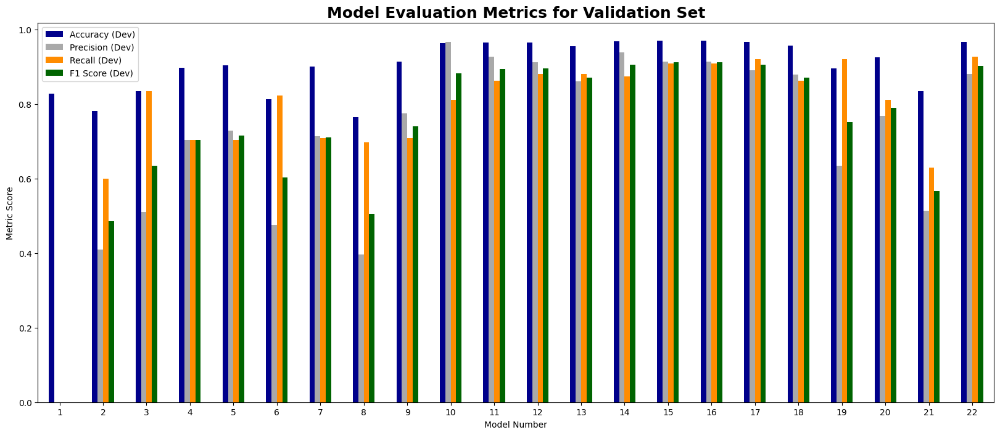

In [85]:
# Create barplot showing evaluation metrics on validation (dev) set for all trained models
df_chart = df_results[["Model Name", "Accuracy (Dev)", "Precision (Dev)", "Recall (Dev)", "F1 Score (Dev)"]]
df_chart.plot.bar(figsize = (20, 8), color = ["darkblue", "darkgray", "darkorange", "darkgreen"], rot = 0)
plt.xlabel("Model Number")
plt.ylabel("Metric Score")
plt.title("Model Evaluation Metrics for Validation Set", fontsize = 18, fontweight = "bold")

# Display plot
plt.show()

##### Observations:
- Our summary table of training/validation results shows that Model #17 (**XGBoost - sklearn - SMOTE** with hyperparameter tuning) and Model #22 (**Ensemble Model - Best XGB-C and TF-NN** with hyperparameter tuning) have the strongest performance metrics across all models. Our recommendation of the *best option* between these two models would ultimately depend on stakeholder needs and preferences, especially with respect to trade-offs, costs and benefits, risks, etc. between higher/lower Accuracy and Precision and higher/lower Recall. ***That said, given the context for the analysis at-hand, details we know/don't know, and considerations of model simplicity, explainability, and reproducibility, we would posit Model #17 as the overall best choice.***
- These results also show that our Random Forest models –– specifically Model #12 (**Random Forest - sklearn - SMOTE**) and Model #13 (**Random Forest - sklearn - SMOTE** with hyperparameter tuning) –– and our XGBoost-competing gradient boosting Model #18 (**AdaBoost - sklearn - SMOTE**) performed strongly. Additionally, nearly every modeling approach we tried surpassed our Baseline models –– Model #1 (**Baseline - Majority**) and Model #2 (**Baseline - Rule**) –– with the exception of a few.
- We are now ready to proceed with a deeper-dive into interpretive and explanatory plots and analysis for our most performative, tuned model (Model #17) before wrapping up with model testing.

### `[4.B] Deep-Dive into Best Performing Model (Diagnostics and Interpretive Plots)`

In [86]:
## SHAP Plotting: Model diagnostics and interpretive/explanatory summaries

# Define explainer and shap_values for plotting
explainer = shap.TreeExplainer(XGB_best)
expected_value = explainer.expected_value
shap_values_1 = explainer(X_train_rssm)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


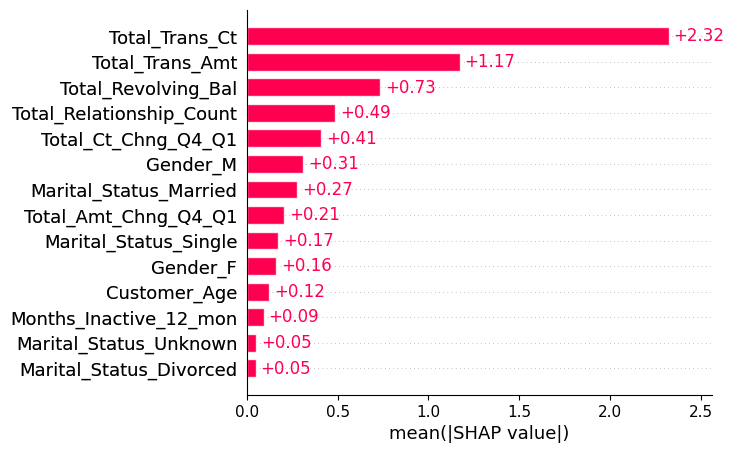

In [87]:
## SHAP Plotting: Model diagnostics and interpretive/explanatory summaries

# XGBoost Gradient Boosting with Hyperparameter Tuning - Shapley Values - Bar Plot
shap.plots.bar(shap_values_1, max_display = 14, show = False)
plt.gcf().set_size_inches(6, 5)
plt.show()

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


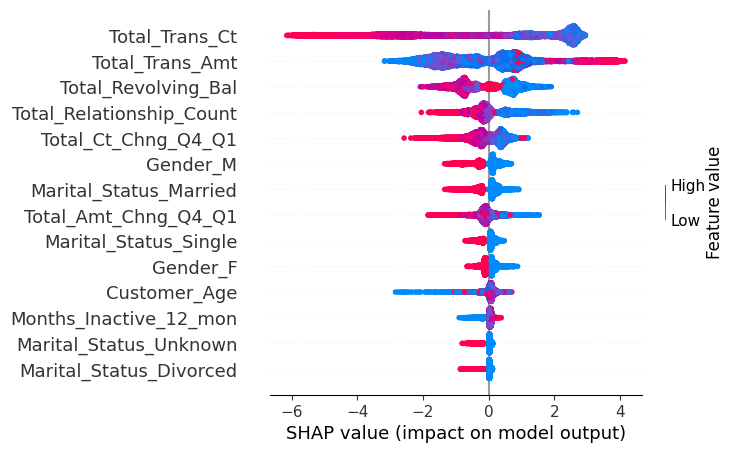

In [88]:
## SHAP Plotting: Model diagnostics and interpretive/explanatory summaries

# XGBoost Gradient Boosting with Hyperparameter Tuning - Shapley Values - Summary Plot
shap.summary_plot(shap_values_1, X_train_rssm, show = False)
plt.gcf().set_size_inches(6, 5)
plt.show()

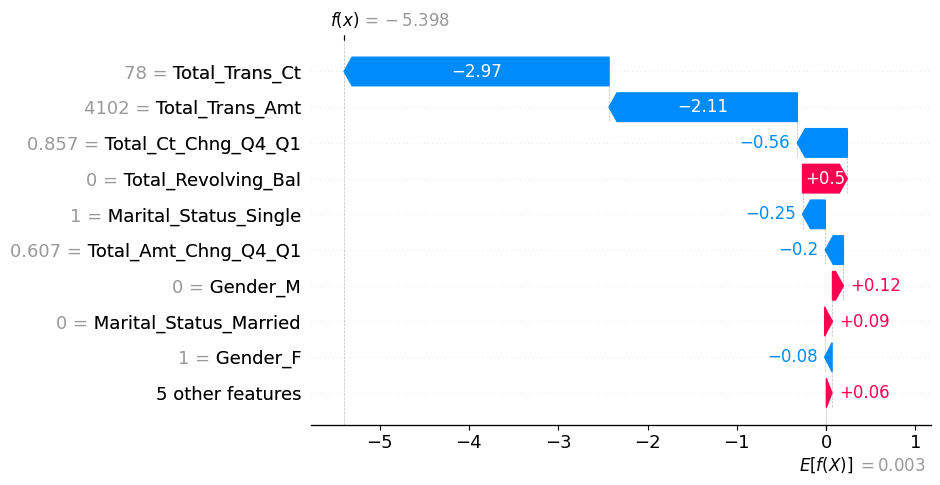

In [89]:
## SHAP Plotting: Model diagnostics and interpretive/explanatory summaries

# XGBoost Gradient Boosting with Hyperparameter Tuning - Shapley Values - Waterfall Plot
shap.plots.waterfall(shap_values_1[0], show = False)
plt.gcf().set_size_inches(8, 5)
plt.show()

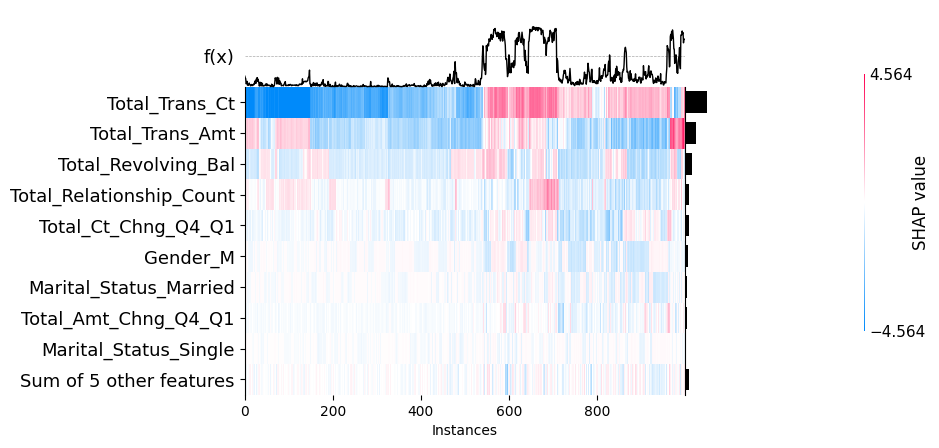

In [90]:
## SHAP Plotting: Model diagnostics and interpretive/explanatory summaries

# XGBoost Gradient Boosting with Hyperparameter Tuning - Shapley Values - Heatmap
shap.plots.heatmap(shap_values_1[:1000], show = False)
plt.gcf().set_size_inches(8, 5)
plt.show()

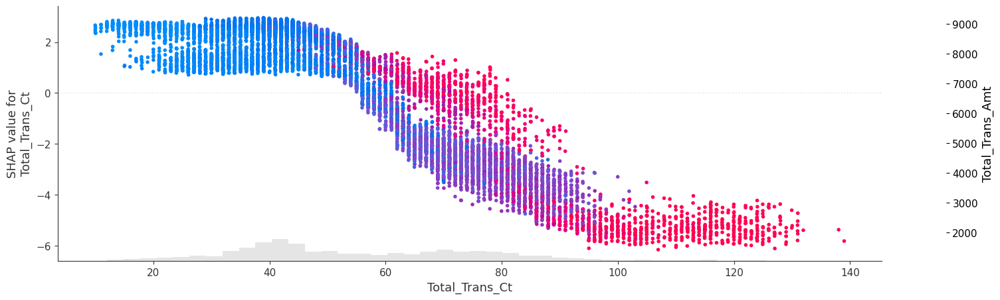

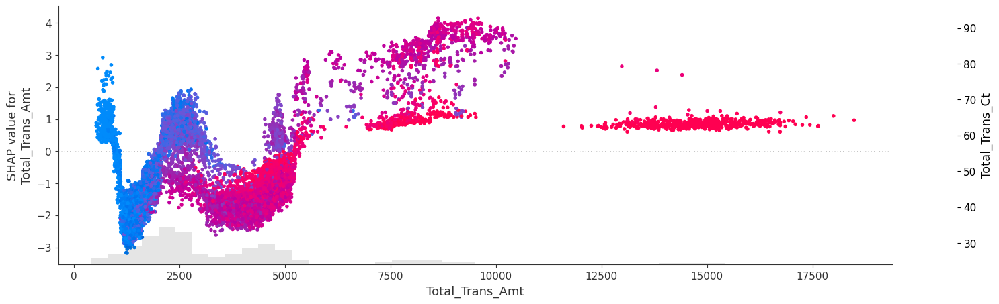

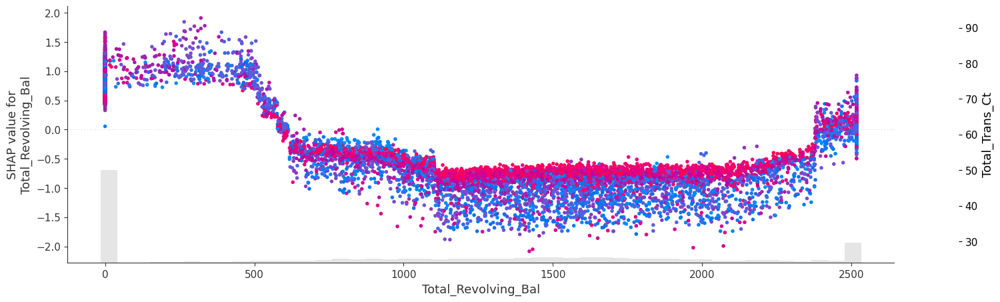

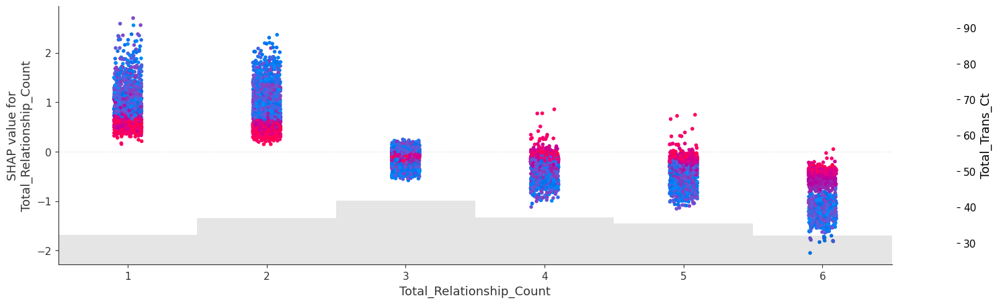

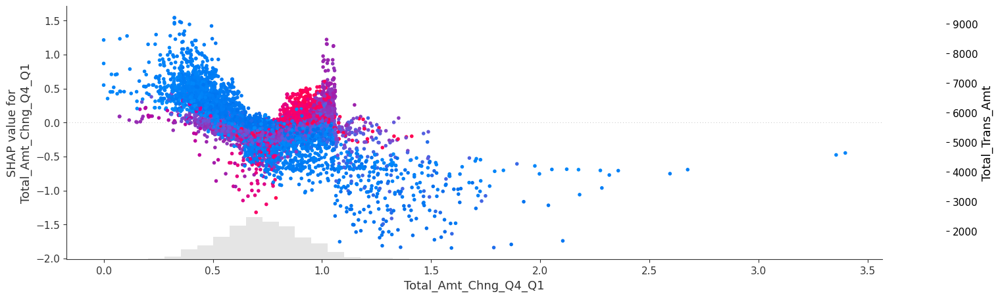

...

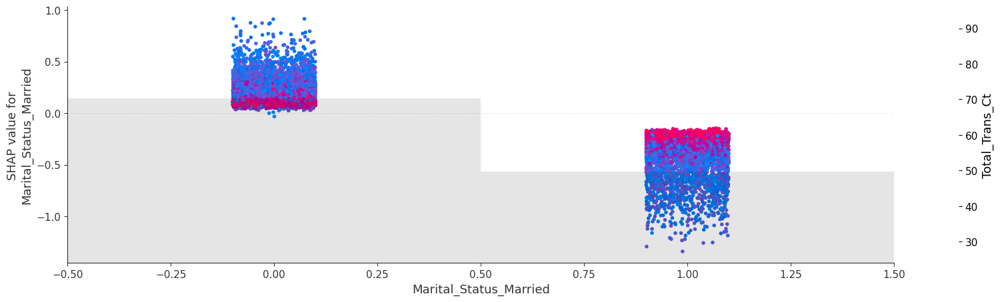

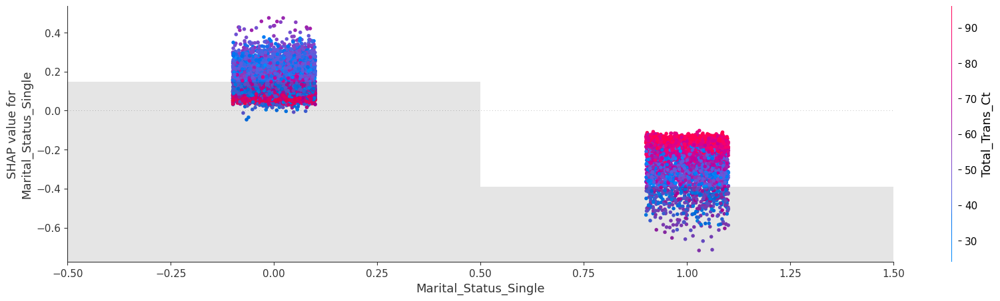

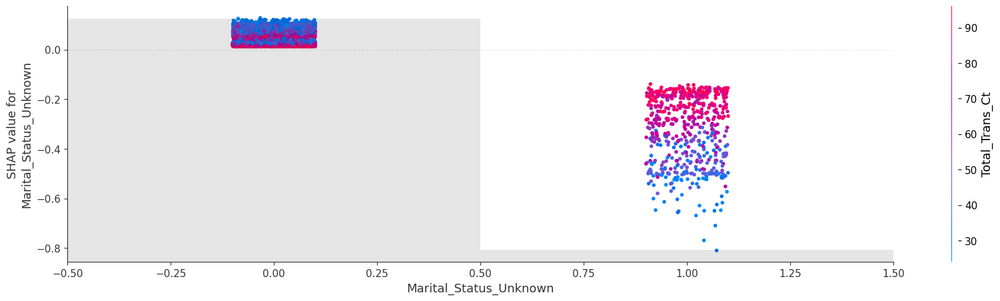

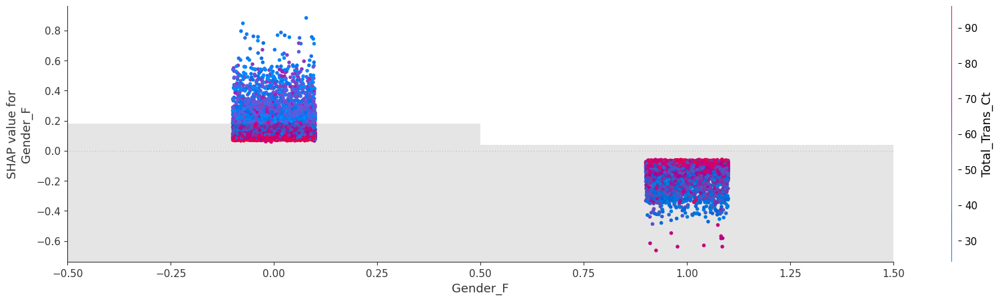

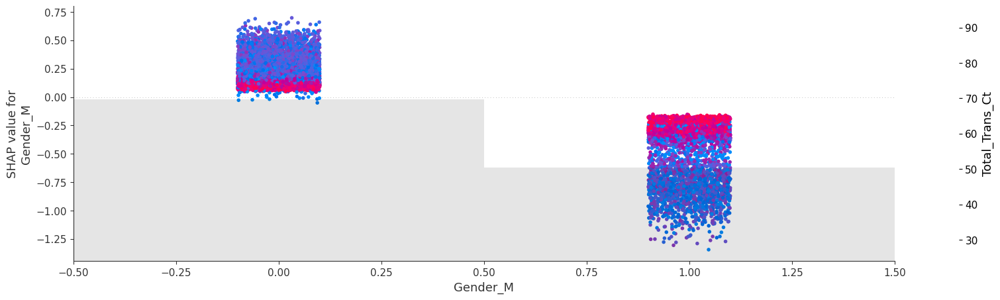

In [91]:
## SHAP Plotting: Model diagnostics and interpretive/explanatory summaries

# XGBoost Gradient Boosting with Hyperparameter Tuning - Shapley Values - Scatterplots
for i in range(len(X_train_rssm.columns)):
    shap.plots.scatter(shap_values_1[:, i], color = shap_values_1, show = False)
    plt.gcf().set_size_inches(20, 5)
    plt.show()

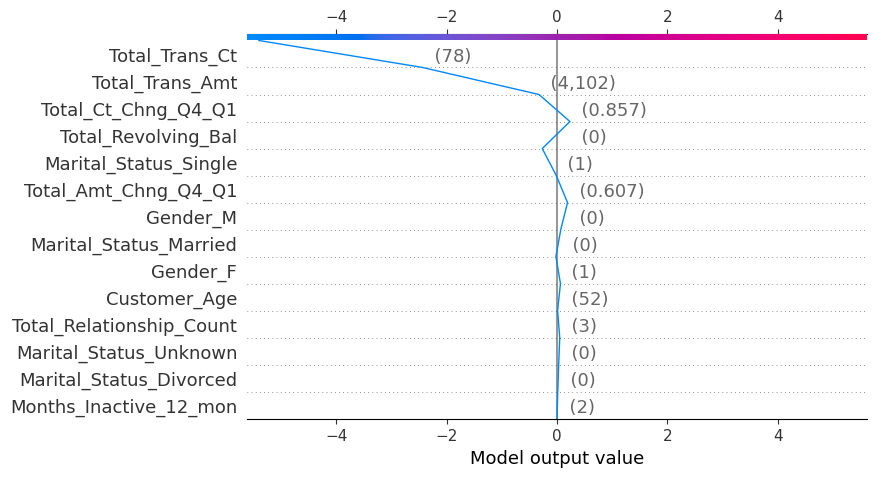

In [92]:
## SHAP Plotting: Model diagnostics and interpretive/explanatory summaries

# XGBoost Gradient Boosting with Hyperparameter Tuning - Shapley Values - Decision Plots
shap.decision_plot(expected_value, shap_values_1.values[0], X_train_rssm, show = False)
plt.gcf().set_size_inches(8, 5)
plt.show()

##### Observations:
- We generated several SHAP (**SH**apley **A**dditive ex**P**lanations) plots to help us examine 1) the overall importance and 2) the directional effect of each variable/feature in our best-performing model, specifically as it relates to making accurate predictions. We referenced this helpful article for some assistance with interpreting the plots: https://www.aidancooper.co.uk/a-non-technical-guide-to-interpreting-shap-analyses/.
- These SHAP plots suggest the following about the features in our model:
    - **`Total_Trans_Ct`**, **`Total_Revolving_Bal`**, **`Total_Relationship_Count`**, and **`Total_Ct_Chng_Q4_Q1`** are among the variables that exert the most "positive force" on the predicted value generated by the model (i.e., they increase the predicted value) when their raw data values are low and the most "negative force" on the predicted value generated by the model (i.e., they decrease the predicted value) when their raw data values are high. This means that customers are predicted to be more likely to attrit when they have a low number of transactions, a low revolving balance, a low number of products associated with their account, and a low change in transaction count quarter-over-quarter.
    - Meanwhile, **`Total_Trans_Amt`** shows mixed results. It appears that there are two "clusters" of customers that are predicted to be more likely to attrit: 1) those with a low amount (size) of transactions and a low volume (count) of transactions, and 2) those with a mid to high amount (size) of transactions and a mid volume (count) of transactions. This interaction between **`Total_Trans_Amt`** and **`Total_Trans_Ct`** is interesting, though ultimately intuitive; we are not surprised to see that the volume (count) of transactions is more predictive of attrition than the amount (size) of transactions, as it's plausible that some disengaged or dissatisfied customers might just naturally operate with a higher per-transaction amount based on the goods/services they purchase.
    - We also see that the model's categorical features –– including **`Gender_M`** / **`Gender_F`** and **`Marital_Status_Married`** / **`Marital_Status_Single`** / **`Marital_Status_Unknown`** / **`Marital_Status_Divoced`** –– as well as **`Customer_Age`** are less predictive overall, corroborating an earlier conclusion we drew from our EDA (**`Part 2`**) that the customers least likely to retain truly possess a wide variety of different demographic characteristics.

### `[4.C] Evaluate Best Performing Model on Testing Set`

In [93]:
## Run Best XGB-C on testing set with and without reduced pred-prob threshold

# Generate model test predictions
xgb_probs_test = np.reshape(XGB_best.predict_proba(X_test_f1)[:, 1], (-1, ))

# Evaluate model performance metrics on testing set - using default predicted probability threshold
dt = 0.50
test_pred_dt = (xgb_probs_test >= dt).astype(int) # Use default threshold (dt) of 0.50

# Display model performance metrics against testing set - using default predicted probability threshold
print(f"Accuracy (Test - Default PP Threshold): {accuracy_score(y_test, test_pred_dt):.4f}")
print(f"Precision (Test - Default PP Threshold): {precision_score(y_test, test_pred_dt):.4f}")
print(f"Recall (Test - Default PP Threshold): {recall_score(y_test, test_pred_dt):.4f}")
print(f"F1 Score (Test - Default PP Threshold): {f1_score(y_test, test_pred_dt):.4f}")

# Add spacer
print("=" * 100, "\n")

# Evaluate model performance metrics on testing set - using reduced predicted probability threshold
rt = 0.40
test_pred_rt = (xgb_probs_test >= rt).astype(int) # Use reduced threshold (rt) to boost Recall

# Display model performance metrics against testing set - using reduced predicted probability threshold
print(f"Accuracy (Test - Reduced PP Threshold): {accuracy_score(y_test, test_pred_rt):.4f}")
print(f"Precision (Test - Reduced PP Threshold): {precision_score(y_test, test_pred_rt):.4f}")
print(f"Recall (Test - Reduced PP Threshold): {recall_score(y_test, test_pred_rt):.4f}")
print(f"F1 Score (Test - Reduced PP Threshold): {f1_score(y_test, test_pred_rt):.4f}")

Accuracy (Test - Default PP Threshold): 0.9620
Precision (Test - Default PP Threshold): 0.8750
Recall (Test - Default PP Threshold): 0.8985
F1 Score (Test - Default PP Threshold): 0.8866

Accuracy (Test - Reduced PP Threshold): 0.9600
Precision (Test - Reduced PP Threshold): 0.8489
Recall (Test - Reduced PP Threshold): 0.9224
F1 Score (Test - Reduced PP Threshold): 0.8841


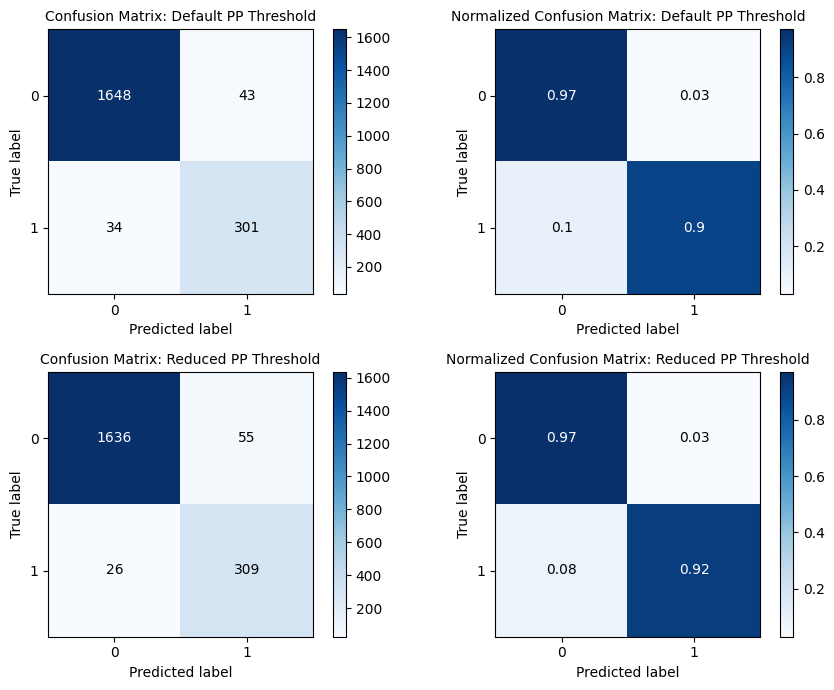

In [94]:
# Display Confusion Matrices to evaluate model performance using dt = 0.50 and rt = 0.40
fig, axes = plt.subplots(2, 2, figsize = (9, 7))
axes = np.ravel(axes)
skplt.metrics.plot_confusion_matrix(
    y_test,
    test_pred_dt,
    normalize = False,
    title = "Confusion Matrix: Default PP Threshold",
    title_fontsize = "medium",
    ax = axes[0]
)
skplt.metrics.plot_confusion_matrix(
    y_test,
    test_pred_dt,
    normalize = True,
    title = "Normalized Confusion Matrix: Default PP Threshold",
    title_fontsize = "medium",
    ax = axes[1]
)
skplt.metrics.plot_confusion_matrix(
    y_test,
    test_pred_rt,
    normalize = False,
    title = "Confusion Matrix: Reduced PP Threshold",
    title_fontsize = "medium",
    ax = axes[2]
)
skplt.metrics.plot_confusion_matrix(
    y_test,
    test_pred_rt,
    normalize = True,
    title = "Normalized Confusion Matrix: Reduced PP Threshold",
    title_fontsize = "medium",
    ax = axes[3]
)
plt.tight_layout()
plt.show()

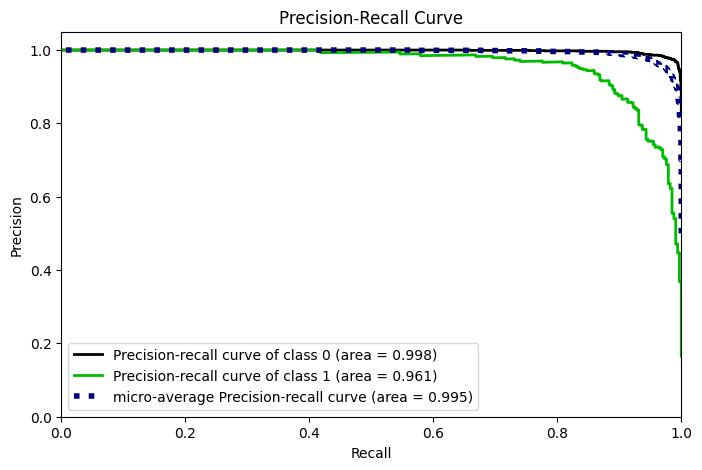

In [95]:
# Display Precision-Recall Curve to evaluate model performance using dt = 0.50
y_probs = XGB_best.predict_proba(X_test_f1)
skplt.metrics.plot_precision_recall(y_test, y_probs)
plt.gcf().set_size_inches(8, 5)
plt.show()

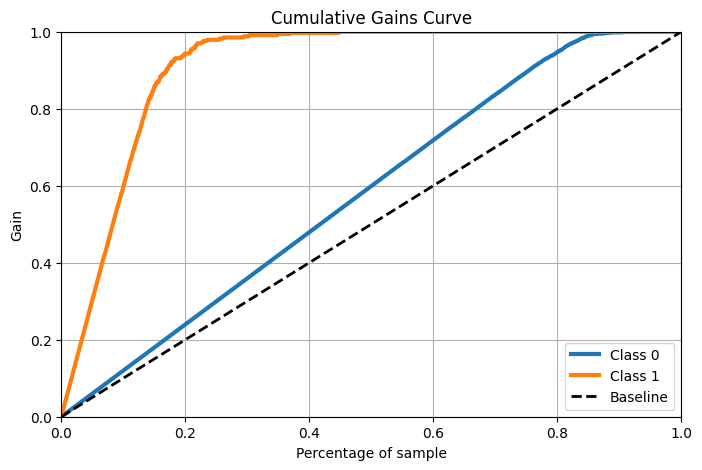

In [96]:
# Display Cumulative Gains Curve to evaluate model performance using dt = 0.50
skplt.metrics.plot_cumulative_gain(y_test, y_probs)
plt.gcf().set_size_inches(8, 5)
plt.show()

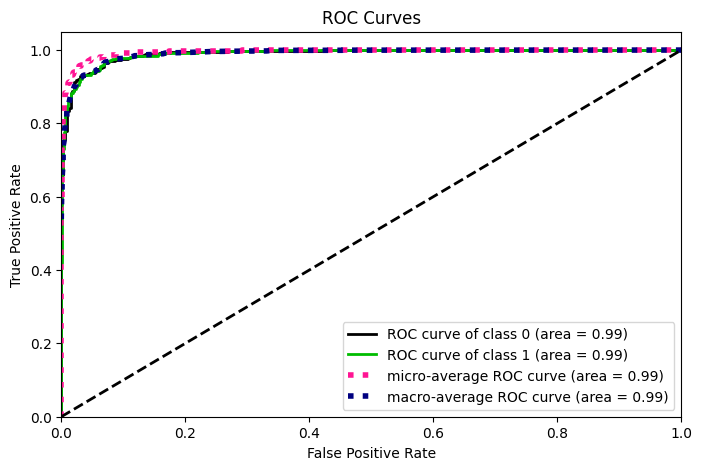

In [97]:
# Display ROC Curves to evaluate model performance using dt = 0.50
skplt.metrics.plot_roc(y_test, y_probs)
plt.gcf().set_size_inches(8, 5)
plt.show()

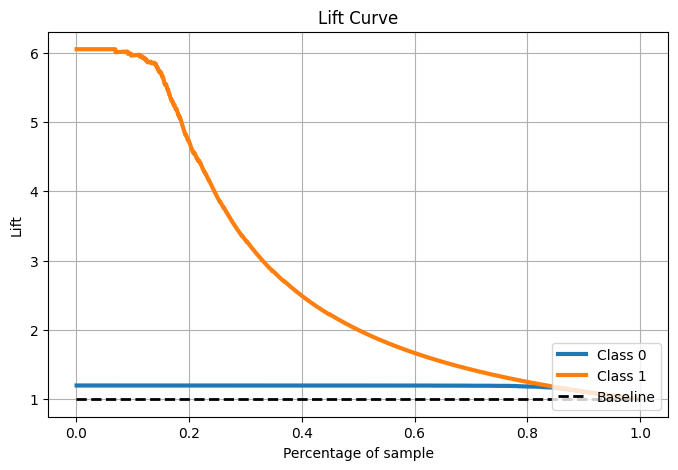

In [98]:
# Display Lift Curve to evaluate model performance using dt = 0.50
skplt.metrics.plot_lift_curve(y_test, y_probs)
plt.gcf().set_size_inches(8, 5)
plt.show()

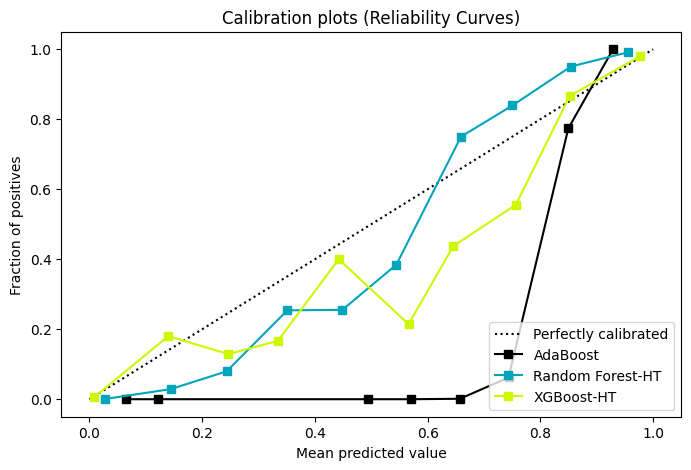

In [99]:
# Define predicted probabilities/scores for Calibration Plots using dt = 0.50
abc_probas = ABC.predict_proba(X_test_f1)
rf_probas = RF_best.predict_proba(X_test_f1)
xgb_probas = XGB_best.predict_proba(X_test_f1)
probas_list = [abc_probas, rf_probas, xgb_probas]
model_names = [
    "AdaBoost",
    "Random Forest-HT",
    "XGBoost-HT"
]

# Display Calibration Plots to evaluate model performance against other tree-based GB models using dt = 0.50
skplt.metrics.plot_calibration_curve(y_test, probas_list, model_names)
plt.gcf().set_size_inches(8, 5)
plt.show()

##### Observations:
- Our best-performing model maintains strong performance when evaluated against our testing set. This is true when we use the default predicted probability threshold of 0.50 and a reduced probability threshold to boost Recall. All model performance metrics –– Accuracy, Precision, Recall, and F1 Score –– show values between 0.8750 (lowest - Precision) and 0.9620 (highest - Accuracy) for our default threshold scenario and values between 0.8489 (lowest - Precision) and 0.9600 (highest - Accuracy) for our reduced threshold scenario.
- A confusion matrix using the default predicted probability threshold reveals that a very small number of testing cases are being categorized as False Negatives (FNs, ~1.7%) or False Positives (FPs, ~2.1%). Likewise, a confusion matrix using the reduced threshold reveals that an even smaller number of testing cases are being categorized as False Negatives (FNs, ~1.3%) and slightly more as False Positives (FPs, ~2.7%). This is an encouraging result.
- Precision-Recall Curves, Cumulative Gains Curves, ROC Curves, Lift Curves, and Calibration Plots (Reliability Curves) all indicate positive results, as well. While our top-performing models show sub-optimal calibration, we're cognizant of the fact that their calibration results are being influenced by our Recall-optimization goal. We know that if a model is optimized for Recall and has a high Recall score, it may not appear perfectly-calibrated. It may ultimately signal many "false alarm" predictions (i.e., be "overly optimistic" in its predictions), which can manifest in a high "false positive" rate. As a result, the model may look *uncalibrated* (to a degree) because the predicted probabilities of positive and negative classes may not be representative of their true probabilities in the underlying data. We're okay with this result here.

### `[4.D] Part 4 Summary`
- We evaluated the performance metrics for all models trained in **`Part 3`**.
- We selected a model with some of the highest performance metrics (i.e., our best performing model) and chose to proceed with further analysis on it.
- We explored our best-performing model's predictions using SHAP as our primary framework for model interpretive analysis and diagnostics.
- We summarized the key features and impacts (direction/magnitude) of these features on the model's predictions.
- We ran our best-performing model against the testing set to see if it could generalize well to new, unseen data.
- We generated a variety of standard visualizations and plots to assess model performance.
- We are now ready to wrap up our analysis, describe our main take-aways, and summarize key impacts/implications to the business (**`Part 5`**).

------------------------------------------------------------------------------------------------------------------

## ====================================================================
## Part 5: Conclusions, Implications, and Next Steps
**Objective:** Summarize conclusions, implications, and next steps to share with the business.
## ====================================================================

#### Concluding Remarks:
We would encourage the bank to adopt and deploy our "Credit Card Churn" classification model, provided our results make sense to domain experts in bank leadership. More specifically, we would encourage deployment of our **XGBoost - sklearn - SMOTE** model with hyperparameter tuning, either using a reduced predicted probability threshold (e.g., 0.40) for customer attrition predictions or not, depending on the appetite/preferences of bank management around false positive predictions and their associated costs and benefits. Based on this model's performance metrics –– both in training/validation and testing –– we can feel confident that it will accurately predict which customers are most likely to attrit, with relatively few misses. With this information, bank leadership should be able to more effectively plan for the future, charge more competitive loan and credit card interest rates, reduce monthly/quarterly/annual volatility in revenue, and steward their customers' wealth and money with improved care and confidence.

#### Stakeholder Benefits & Next Steps:
How would the bank stand to benefit with our model? We comment on several practical ways the bank could use our model and the insights shared above (in **`Part 3`** and **`Part 4`**) to improve their customer retention and long-term financial success below. Specifically, bank leadership and/or analytics teams could use our model to periodically generate lists of customers that fall into (what we might call) the "attrition danger zone." These lists would include customers that our model predicts are likely to attrit based on signals like low monthly transaction count, low revolving balance, a decline in products/accounts held, etc. Our recommendation to bank leadership would be to use our model and current/up-to-date customer data in their internal databases to generate these lists *proactively and frequently*, so that they could consider taking one or more of the following actions to try to retain them:
- Reach out to these customers with new promotional or incentive offers, like "use our credit card for purchases over the next month and earn 5% cash back if your purchases exceed 1,000 USD".
- Attempt to cross-sell additional products (e.g., a mortgage) or offer better services to these customers (e.g., more credit card reward choices, or lower credit card interest rates –– to the extent such an offer is consistent with bank underwriting/risk guidelines).
- Send personalized notes or newsletters (via USPS/mail or email to reduce expenses) to these customers to show an extra level of care and investment.
- Invite these customers to join a complimentary financial wellness program sponsored by the bank.
- Pilot new ideas, technologies, or opportunities with these customers, subject to their consent to participate in a pilot.
- Solicit feedback from these customers via a mailed or electronic satisfaction survey in an attempt to determine why they might be satisfied or dissatisfied with the bank or brand in general or the bank's credit card services in particular.
- Increase response rates for negative customer feedback shared in reviews of the bank, especially if the feedback is from one of these customers.

#### Ethical or Legal Considerations:
We do not foresee any major ethical or legal challenges arising from the bank deploying our model into its production system. Our model merely surfaces insights to bank leadership that they can ultimately choose to act upon or not. It does not inherently or automatically trigger any actions on bank customers or adjust bank underwriting/risk-selection practices (which would certainly raise more legal questions). However, to avoid any *customer equity* and *customer consent* concerns (key ethical considerations), we'd emphasize that our model should NOT be used to preclude certain customers from bank products or services or to offer preferential treatment to some customers over others. We'd ask that the bank ultimately abide by the principle of "do no harm" with respect to our model and to refrain from proceeding with any customer-impacting actions without express consent from customers. Doing so will ensure that our model does not inadvertently produce any special advantages or disadvantages for certain bank customers, and that all customers retain their freedom/ability to purchase or enroll in each of the bank's products and services for which they are eligible (subject to any existing eligibility rules in place at the bank).

#### Areas for Further Research & Improvement:
With Recall, we measure the percentage of customer records that our model correctly identifies as attrition-inclined out of the total number of customers who actually do attrit. Based on validation and testing results, we'd expect our model's long-term average Recall rate to fall somewhere between ~90-92%. Practically, this means that our model may miss somewhere between 8-10% of attrition-inclined customers before these customers actually attrit. These results are strong: our model should be able to proactively flag ~90%+ of attrition-inclined customers, which puts the bank in a far better position than they are today to retain them. However, to boost Recall even further and minimize the chance of miscuing on customer-save situations –– which could come at the expense of some Precision or Accuracy –– we believe further research should center on exploring some or all of the following ideas, each of which could be implemented in **`Part 3`** and/or **`Part 4`** of our analysis above:
- Incorporate Recursive Feature Elimination with Cross-Validation (RFECV) to improve model feature selection.
- Employ K-fold cross validation during model training (which is superior to a single "static" validation set).
- Use Bayesian Search to explore model hyperparameters and optimize parameter tuning.
- Experiment with additional custom ensemble model builds using neural networks/deep-learning.

In addition to these areas, we'd recommend the following four ideas for further research and continuous improvement if bank leadership is aligned with model deployment as a next step:
- Collect more data to help with ongoing training, validation, and optimization of the model.
- Implement an "embargo period" (or "dark launch") –– where the model runs on non-production data for QC/QA checks and testing over a short period of time –– prior to model production deployment.
- Conduct a retrospective after the official launch of the model to document insights around what worked well and what could have been better.
- Establish a robust post-launch results monitoring plan with clear owners/responsibilities, which can lead to new ideas for further marginal improvements in the model and provide a mechanism for quickly responding to any errors or adverse business results that may arise from the model over time.